In [1]:
import logging
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from pyobsbox import Checker

In [3]:
logging.getLogger("pyobsbox").setLevel(logging.WARNING)
logging.getLogger("pyobsbox.plotter").setLevel(logging.DEBUG)

# List models

In [4]:
models_folder = Path("../../models")

In [5]:
[model.name for model in list(models_folder.glob('model_*'))]

['model_conv_64_32_16_8_stride_4_B1H_Inst_znorm_abs_diff_seed_42',
 'model_dense_512_128_32_8_B1H_Inst_center_scale_100_seed_42',
 'model_conv_64_32_16_8_stride_4_B1H_Inst_znorm_seed_42',
 'model_time_dist_32_16_B1H_Inst_500',
 'model_conv_64_32_16_8_stride_4_noDO_decode_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_stride_4_B1H_Inst',
 'model_conv_32_16_stride_4_B1H_Inst_jorg',
 'model_conv_max_pool_64_32_16_8_stride_4_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_center_scale_1000_seed_42',
 'model_conv_64_32_16_8_stride_4_noDO_decode_B1H_Inst_min_max_rolling_avg_std_window_2049_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_10000_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_1000_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_znorm_seed_42',
 'model_conv_32

In [6]:
model_path = models_folder / "model_conv_64_32_16_8_stride_4_noDO_decode_B1H_Inst_znorm_rolling_avg_std_window_65_seed_42"

In [7]:
checker = Checker(model_path)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 512, 64)           960       
_________________________________________________________________
dropout (Dropout)            (None, 512, 64)           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 128, 32)           14368     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128, 32)           0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 32, 16)            3600      
_________________________________________________________________
dropout_2 (Dropout)          (None, 32, 16)            0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 8, 8)              9

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

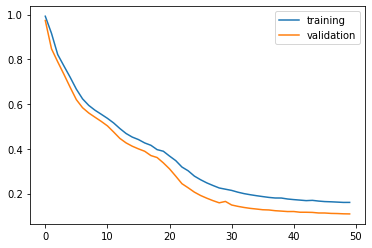

In [8]:
checker.plot_loss()

In [9]:
train_data, train_meta = checker.load_train_dataset()
train_prediction = checker.predict(train_data)

bunch_sorted_index: [0 2 1]
group_bunches: [230. 428. 354.]
group_bunches sorted: [230. 354. 428.]
restore_index: [0 2 1]
group_bunches restored: [230. 428. 354.]
bunch_sorted_index: [0 1 2]
group_bunches: [2491. 2612. 2735.]
group_bunches sorted: [2491. 2612. 2735.]
restore_index: [0 1 2]
group_bunches restored: [2491. 2612. 2735.]
bunch_sorted_index: [1 3 2 0]
group_bunches: [2824.  483. 1923. 1492.]
group_bunches sorted: [ 483. 1492. 1923. 2824.]
restore_index: [3 0 2 1]
group_bunches restored: [2824.  483. 1923. 1492.]
bunch_sorted_index: [0 1 2]
group_bunches: [473. 683. 686.]
group_bunches sorted: [473. 683. 686.]
restore_index: [0 1 2]
group_bunches restored: [473. 683. 686.]

50/50 [==============================] - 60s 1s/step


In [10]:
train_meta.head()

,type,fill,beam,plane,q,date_time,file,n_bunches,bunch_index,bunch_number,ts_length,chunk
4674,Inst,6615,1,h,7,2018-04-26 23:04:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6615/...,603,479.0,97.0,65536,18
2800,Inst,6749,1,h,7,2018-06-01 03:53:35,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6749/...,780,148.0,73.0,65536,10
6197,Inst,6759,1,h,7,2018-06-05 02:29:13,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6759/...,2556,1692.0,1225.0,65536,24
3359,Inst,6966,1,h,7,2018-07-24 00:53:27,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6966/...,2556,535.0,389.0,65536,13
7716,Inst,6629,1,h,7,2018-05-01 17:23:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6629/...,1887,1088.0,613.0,65536,30


In [11]:
train_meta.shape

(396800, 12)

In [12]:
train_data.shape

(396800, 2048, 2)

In [13]:
train_prediction.shape

(396800, 2048, 2)

In [14]:
validation_data, validation_meta = checker.load_validation_dataset()
validation_prediction = checker.predict(validation_data)


5/5 [==============================] - 5s 985ms/step


In [15]:
validation_meta.head()

,type,fill,beam,plane,q,date_time,file,n_bunches,bunch_index,bunch_number,ts_length,chunk
4808,Inst,6243,1,h,7,2017-09-26 08:19:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6243/...,1916,1121.0,610.0,65536,18
1244,Inst,6891,1,h,7,2018-07-06 17:59:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6891/...,1452,2654.0,1127.0,65536,4
5767,Inst,6757,1,h,7,2018-06-04 15:31:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6757/...,2556,2086.0,1529.0,65536,22
7206,Inst,6752,1,h,7,2018-06-02 11:24:52,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6752/...,108,89.0,21.0,65536,28
7624,Inst,6243,1,h,7,2017-09-26 08:19:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6243/...,1916,1121.0,610.0,65536,29


In [16]:
validation_meta.shape

(39680, 12)

In [17]:
validation_data.shape

(39680, 2048, 2)

In [18]:
validation_prediction.shape

(39680, 2048, 2)

In [19]:
def plot_train_index(index: int):
    """Helper function to plot a sample from the train dataset.
    """
    true_signal = train_data[index]
    predicted_signal = train_prediction[index]
    metadata_row = train_meta.iloc[index]
    print(f"index: {index}")
    print(f"Error: {train_error[index]}")
    print(metadata_row)
    checker.plot_sample(metadata_row, true_signal, predicted_signal)
    plt.show()
    encoded = checker.encode(true_signal)
    plt.imshow(encoded)
    plt.show()

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

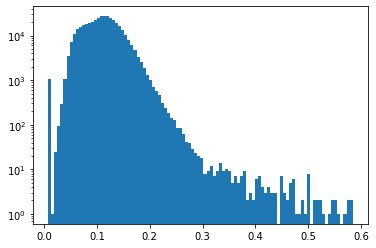

In [20]:
train_error = checker.MSE(train_data, train_prediction)
checker.plot_error(train_error, bins=100)

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

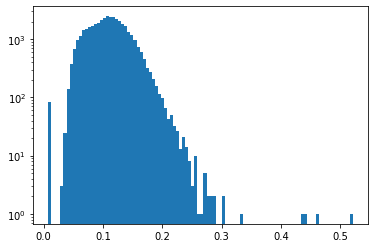

In [21]:
validation_error = checker.MSE(validation_data, validation_prediction)
checker.plot_error(validation_error, bins=100)

In [22]:
# Histogram peak
hist, bins = np.histogram(train_error, bins=100)
hist_peak = bins[np.argmax(hist)]

index: 0
Error: 0.13475934723399136
type                                                         Inst
fill                                                         6615
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-04-26 23:04:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6615/...
n_bunches                                                     603
bunch_index                                                   479
bunch_number                                                   97
ts_length                                                   65536
chunk                                                          18
Name: 4674, dtype: object


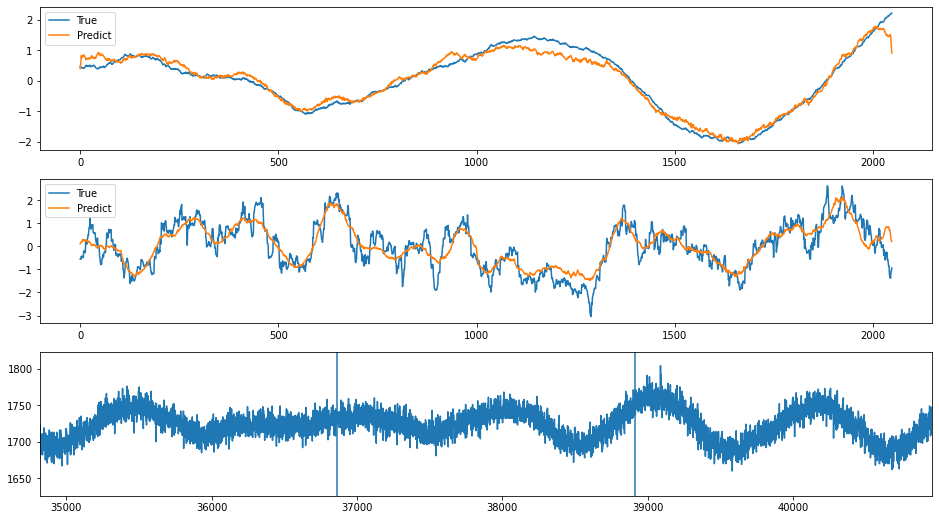

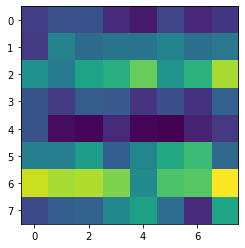

In [23]:
# plotting a random sample
plot_train_index(0)

In [24]:
sorted_error_indices = np.argsort(train_error)

# From left to right

index: 57857
Error: 0.007916768933361048
type                                                         Inst
fill                                                         6268
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-03 12:24:50
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6268/...
n_bunches                                                     300
bunch_index                                                   428
bunch_number                                                  212
ts_length                                                   65536
chunk                                                           3
Name: 902, dtype: object


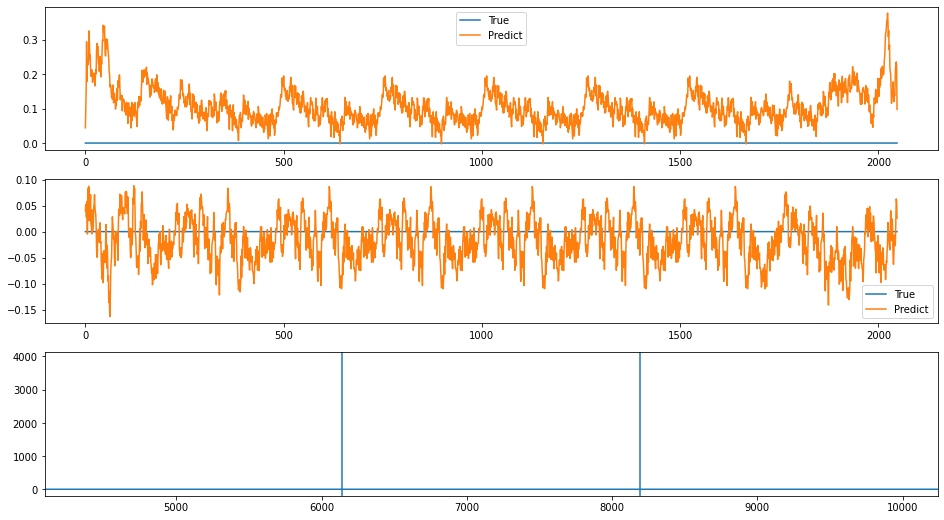

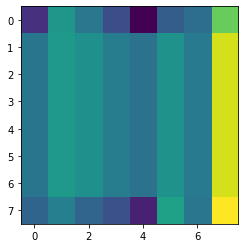

index: 146745
Error: 0.007916768933361048
type                                                         Inst
fill                                                         7314
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-17 23:05:11
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7314/...
n_bunches                                                     108
bunch_index                                                   401
bunch_number                                                   27
ts_length                                                   65536
chunk                                                          14
Name: 3637, dtype: object


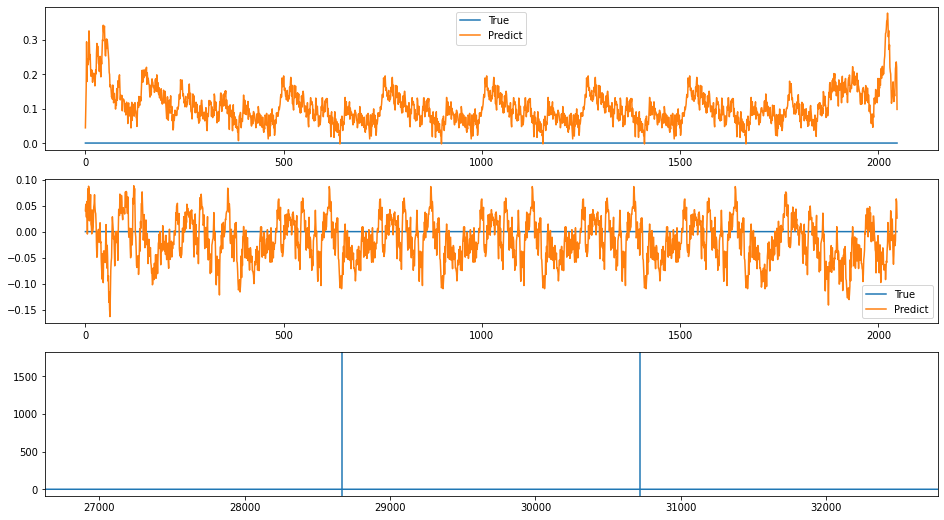

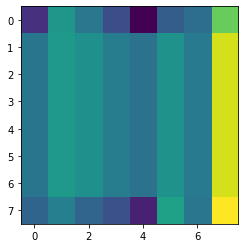

index: 204228
Error: 0.007916768933361048
type                                                         Inst
fill                                                         6671
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-11 16:02:43
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6671/...
n_bunches                                                     156
bunch_index                                                   343
bunch_number                                                  127
ts_length                                                   65536
chunk                                                          13
Name: 3384, dtype: object


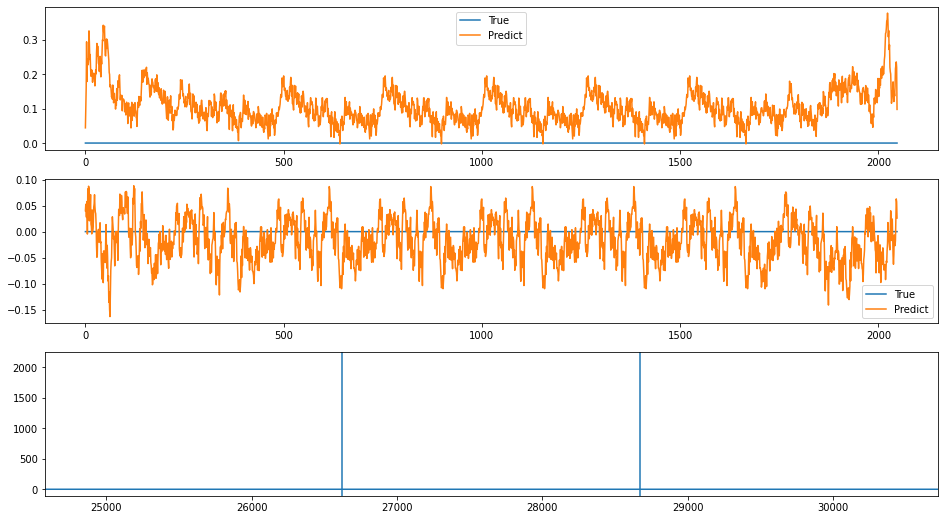

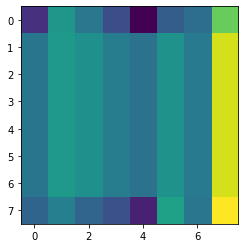

index: 134168
Error: 0.007916768933361048
type                                                         Inst
fill                                                         6384
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-12 19:12:42
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6384/...
n_bunches                                                     524
bunch_index                                                  1341
bunch_number                                                  488
ts_length                                                   65536
chunk                                                           4
Name: 1069, dtype: object


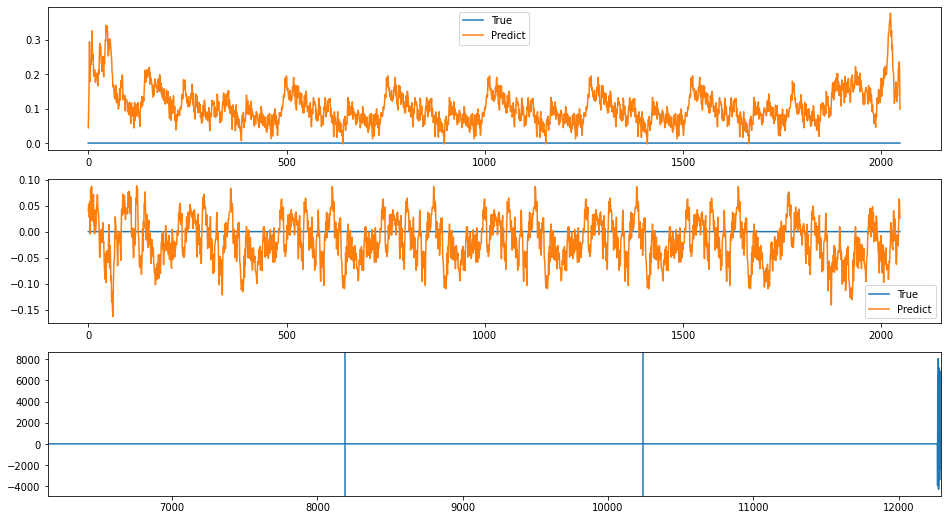

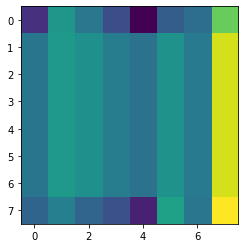

index: 212678
Error: 0.007916768933361048
type                                                         Inst
fill                                                         6904
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-08 20:34:19
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6904/...
n_bunches                                                     444
bunch_index                                                   544
bunch_number                                                  392
ts_length                                                   65536
chunk                                                          17
Name: 4541, dtype: object


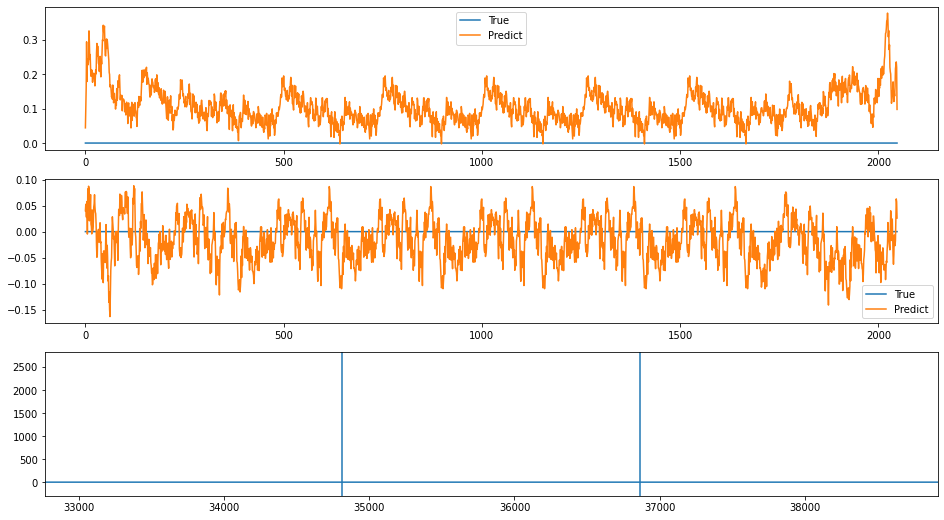

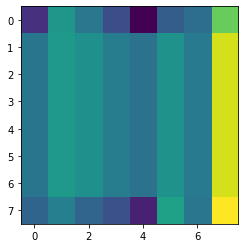

index: 20108
Error: 0.007916768933361048
type                                                         Inst
fill                                                         7446
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-15 19:20:44
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7446/...
n_bunches                                                     648
bunch_index                                                  3342
bunch_number                                                  626
ts_length                                                   65536
chunk                                                           6
Name: 1780, dtype: object


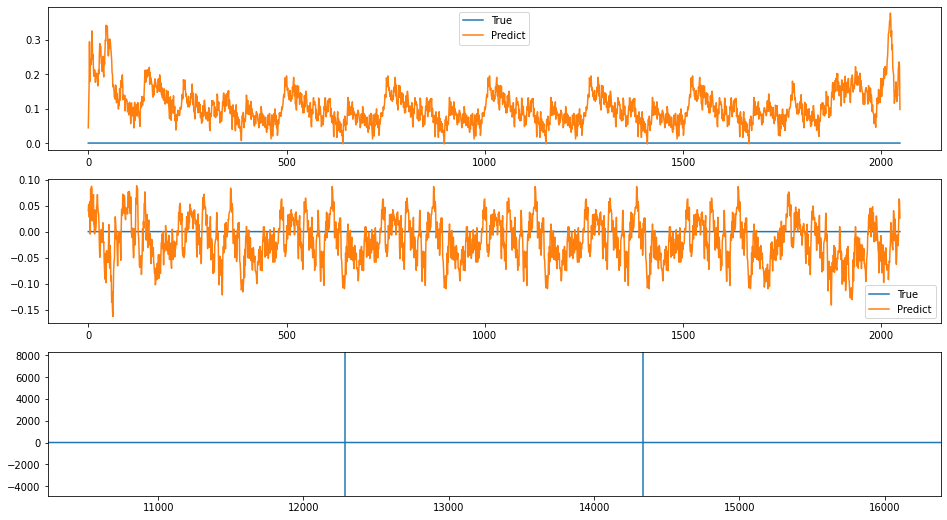

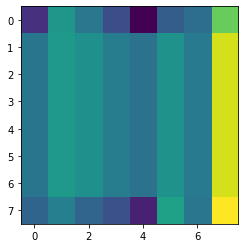

index: 123329
Error: 0.007916768933361048
type                                                         Inst
fill                                                         6399
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-20 12:33:55
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6399/...
n_bunches                                                     908
bunch_index                                                  2006
bunch_number                                                  853
ts_length                                                   65536
chunk                                                           3
Name: 950, dtype: object


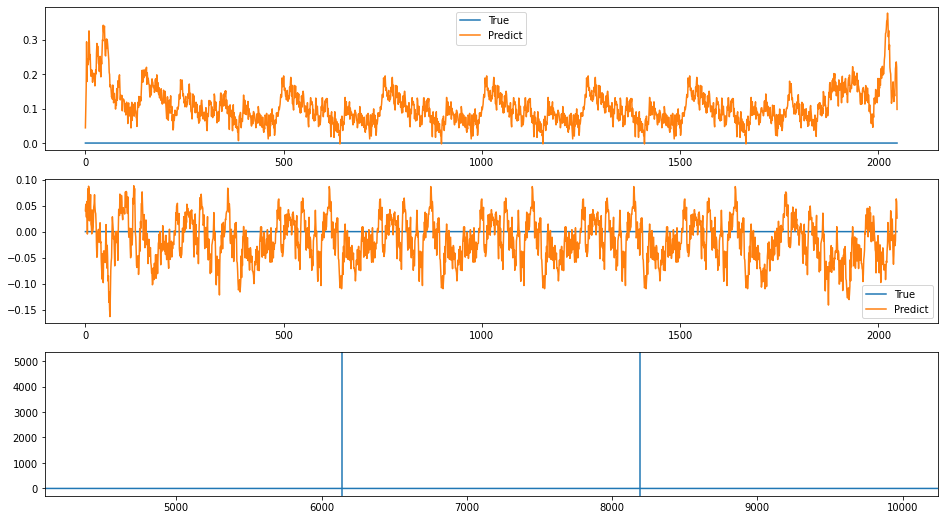

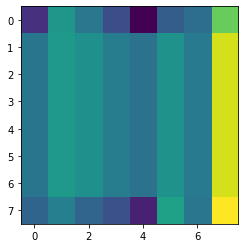

index: 388531
Error: 0.007916768933361048
type                                                         Inst
fill                                                         7095
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-28 01:58:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7095/...
n_bunches                                                     924
bunch_index                                                  1165
bunch_number                                                  849
ts_length                                                   65536
chunk                                                          23
Name: 6033, dtype: object


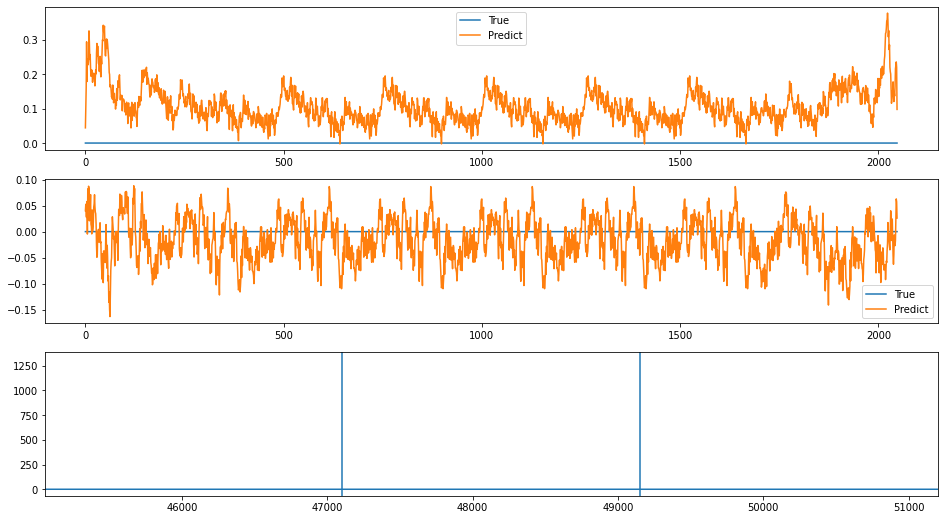

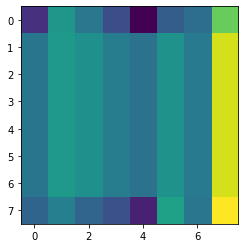

index: 191716
Error: 0.007916768933361048
type                                                         Inst
fill                                                         6192
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-12 17:16:55
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/...
n_bunches                                                     572
bunch_index                                                   995
bunch_number                                                  543
ts_length                                                   65536
chunk                                                           5
Name: 1442, dtype: object


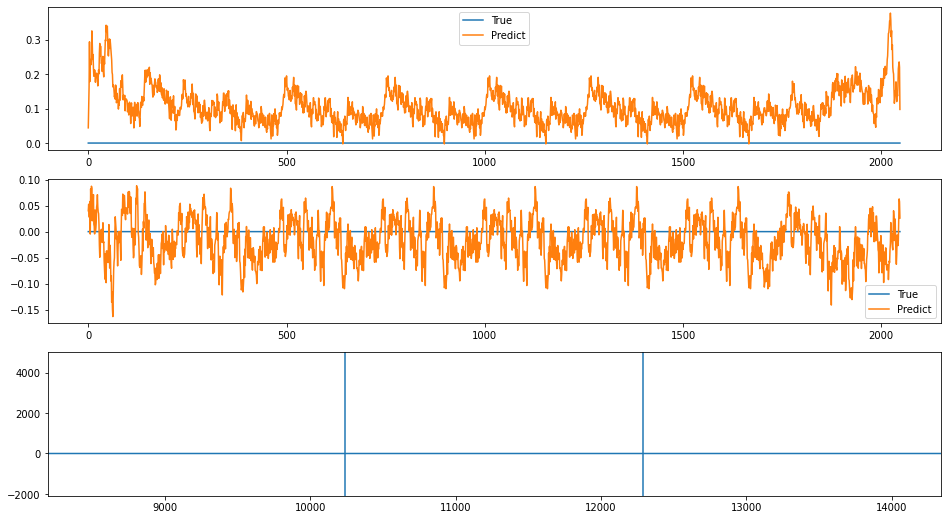

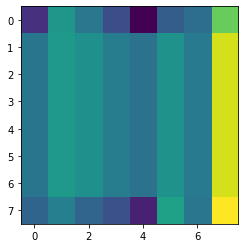

index: 275634
Error: 0.007916768933361048
type                                                         Inst
fill                                                         7047
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-12 15:30:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7047/...
n_bunches                                                     540
bunch_index                                                   577
bunch_number                                                  400
ts_length                                                   65536
chunk                                                           2
Name: 569, dtype: object


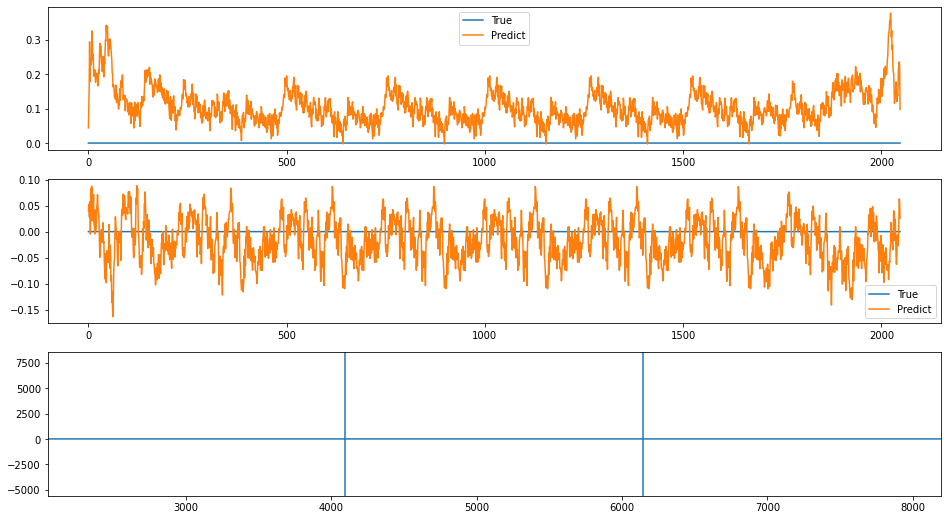

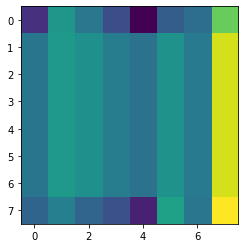

In [25]:
for i in range(10):
    index = sorted_error_indices[i]
    plot_train_index(index)

# From right to left

index: 339043
Error: 0.5838370554640095
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                           1
Name: 275, dtype: object


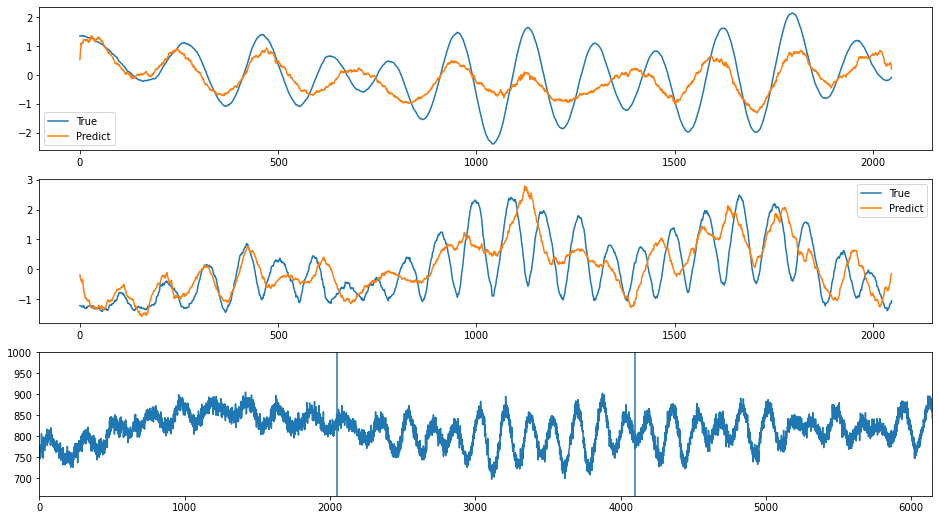

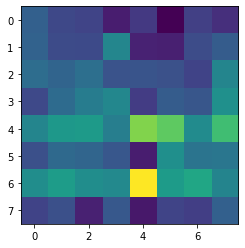

index: 337261
Error: 0.5789975348349636
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                          24
Name: 6163, dtype: object


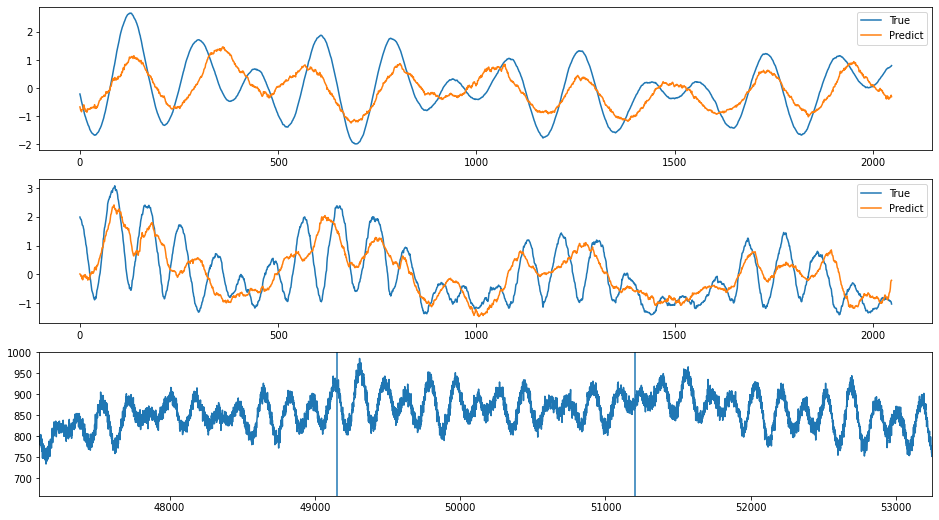

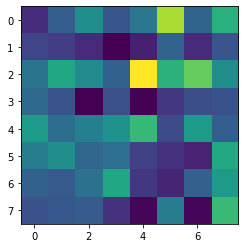

index: 339462
Error: 0.5740507590901774
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                          26
Name: 6675, dtype: object


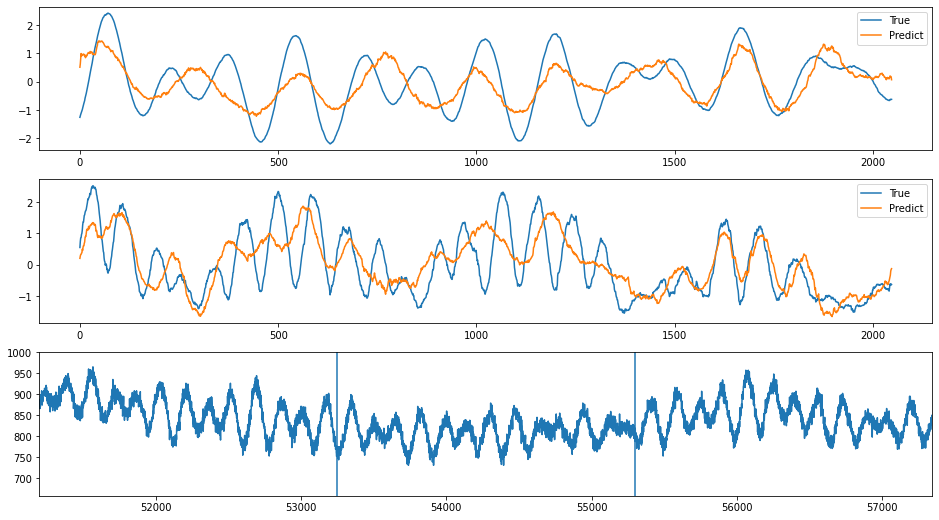

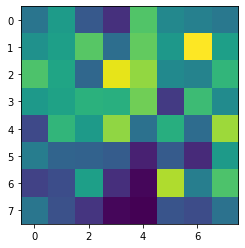

index: 138907
Error: 0.5723309386060743
type                                                         Inst
fill                                                         6382
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-12 15:37:36
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6382/...
n_bunches                                                     396
bunch_index                                                  1104
bunch_number                                                  364
ts_length                                                   65536
chunk                                                           5
Name: 1413, dtype: object


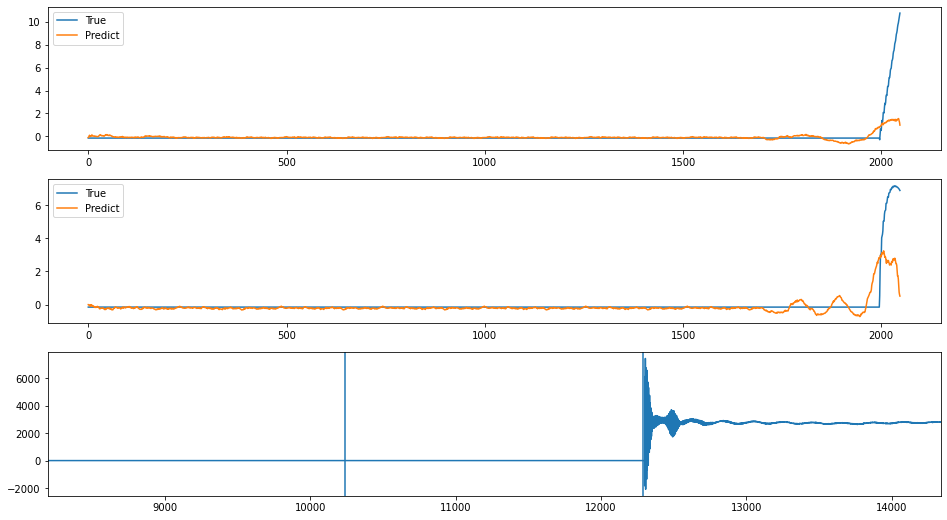

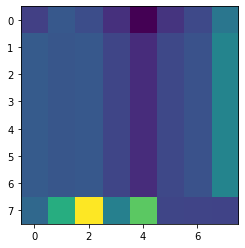

index: 223308
Error: 0.56762062273575
type                                                         Inst
fill                                                         7362
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-26 16:18:45
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7362/...
n_bunches                                                     157
bunch_index                                                   387
bunch_number                                                  140
ts_length                                                   65536
chunk                                                          25
Name: 6436, dtype: object


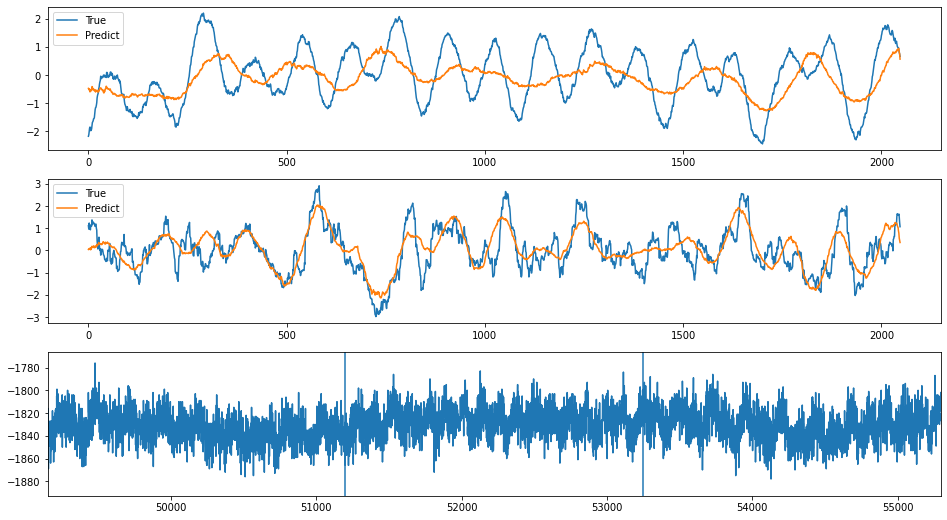

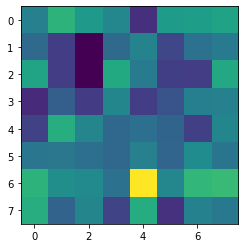

index: 340936
Error: 0.5553872341897459
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                           7
Name: 1811, dtype: object


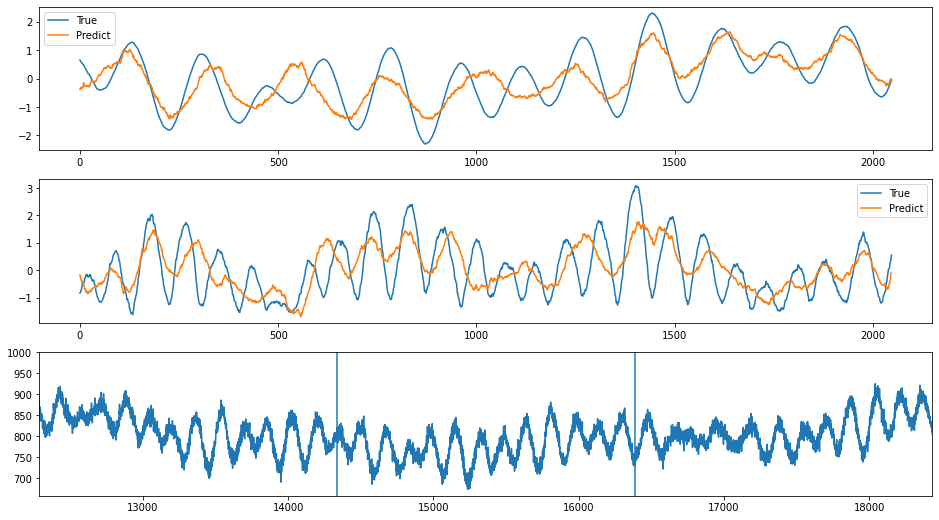

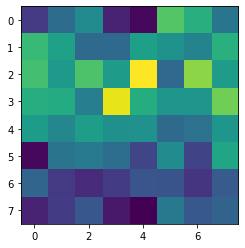

index: 336441
Error: 0.5540592122582899
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                          15
Name: 3859, dtype: object


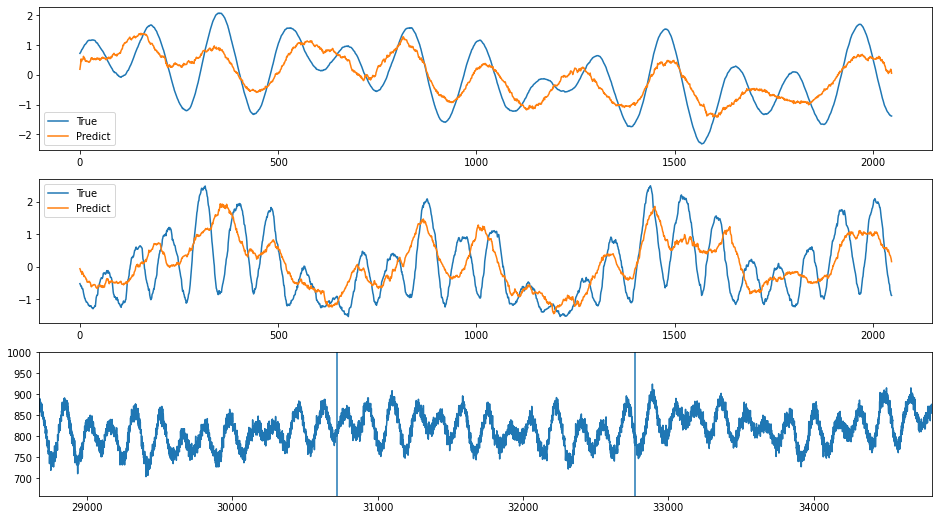

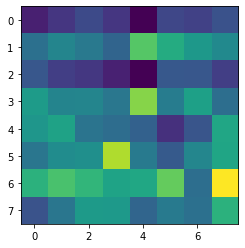

index: 339212
Error: 0.5522540554647042
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                          10
Name: 2579, dtype: object


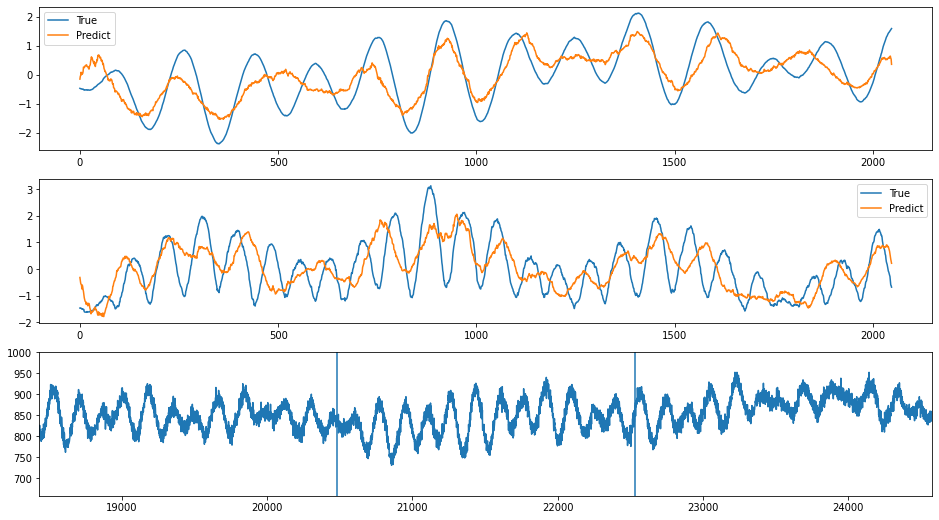

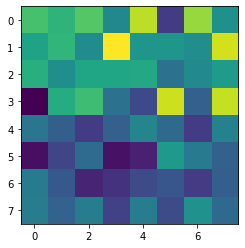

index: 53710
Error: 0.5476832853367724
type                                                         Inst
fill                                                         7383
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:15:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7383/...
n_bunches                                                     156
bunch_index                                                  1025
bunch_number                                                  123
ts_length                                                   65536
chunk                                                           5
Name: 1511, dtype: object


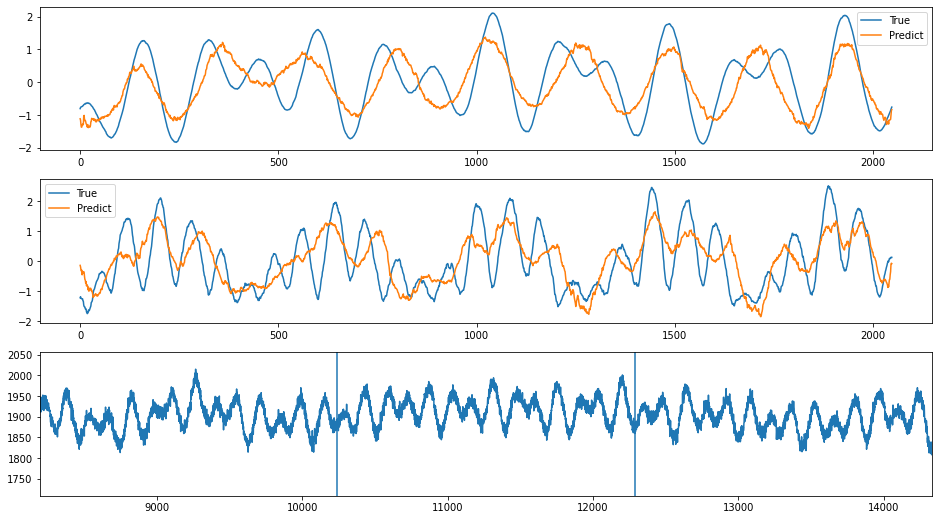

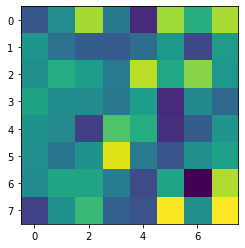

index: 337374
Error: 0.547124198673195
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                          29
Name: 7443, dtype: object


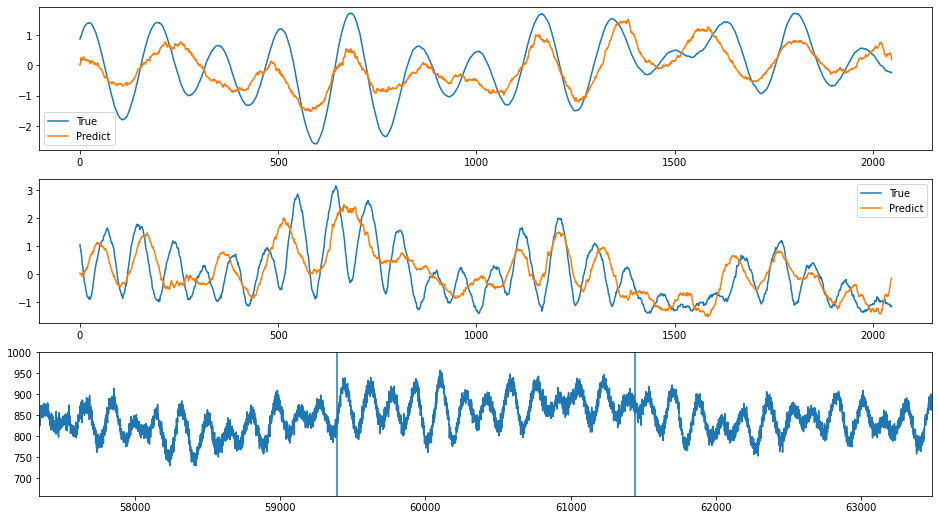

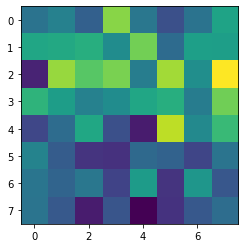

index: 159847
Error: 0.539390451436941
type                                                         Inst
fill                                                         7392
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-30 19:15:11
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7392/...
n_bunches                                                     300
bunch_index                                                  2206
bunch_number                                                  235
ts_length                                                   65536
chunk                                                          10
Name: 2716, dtype: object


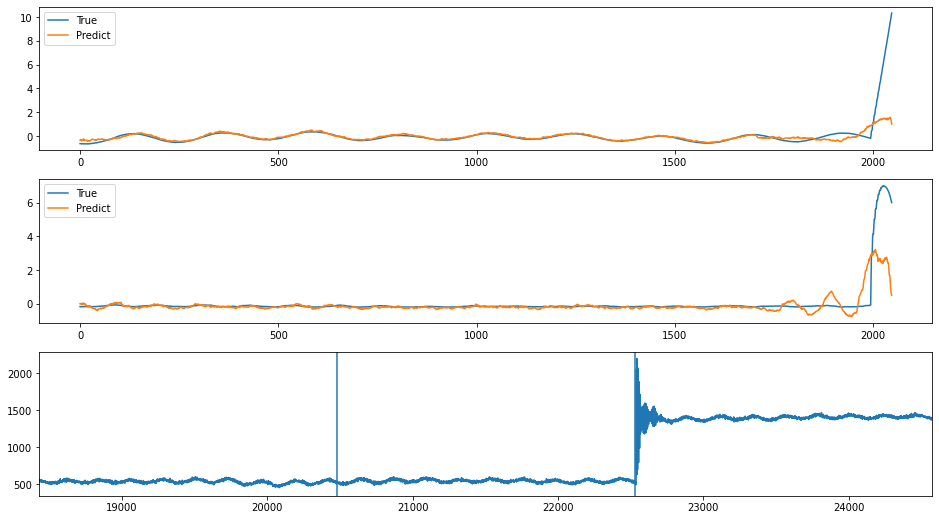

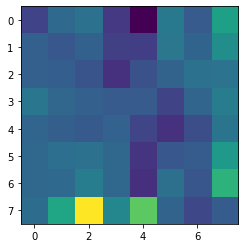

index: 53714
Error: 0.5268228135683326
type                                                         Inst
fill                                                         7383
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:15:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7383/...
n_bunches                                                     156
bunch_index                                                  1025
bunch_number                                                  123
ts_length                                                   65536
chunk                                                           7
Name: 2023, dtype: object


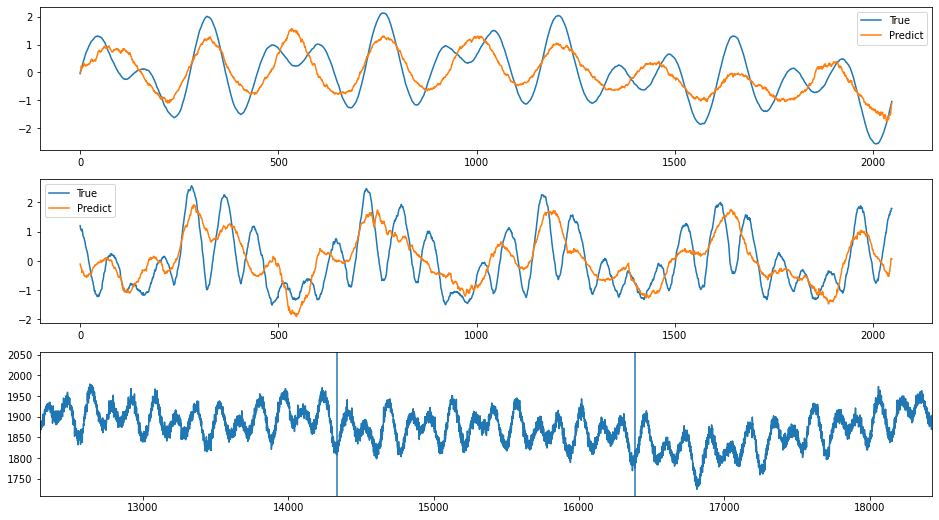

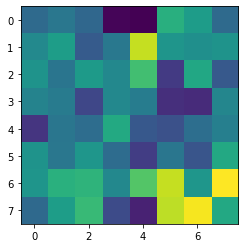

index: 337863
Error: 0.5249481943927228
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                          12
Name: 3091, dtype: object


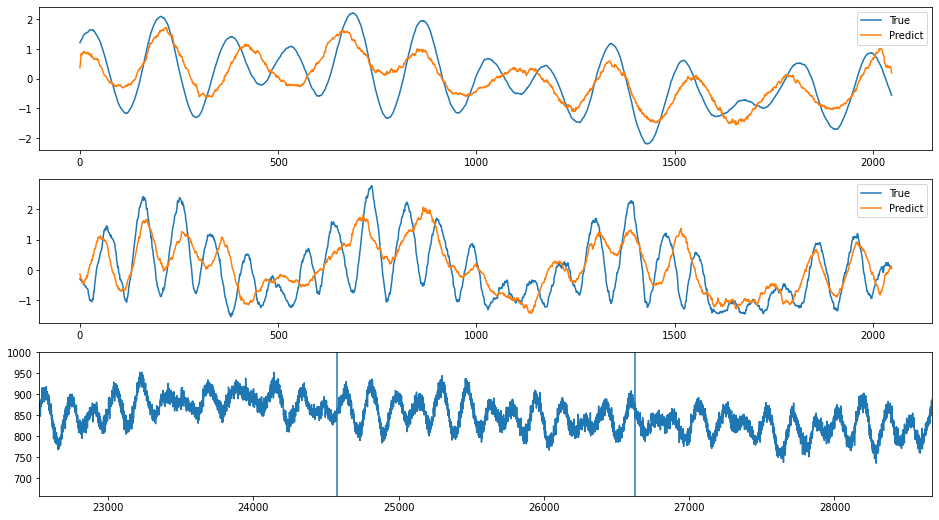

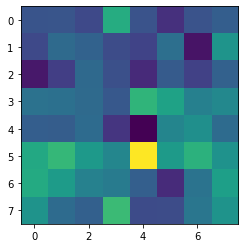

index: 49756
Error: 0.5213018571634687
type                                                         Inst
fill                                                         7383
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:15:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7383/...
n_bunches                                                     156
bunch_index                                                  1025
bunch_number                                                  123
ts_length                                                   65536
chunk                                                           9
Name: 2535, dtype: object


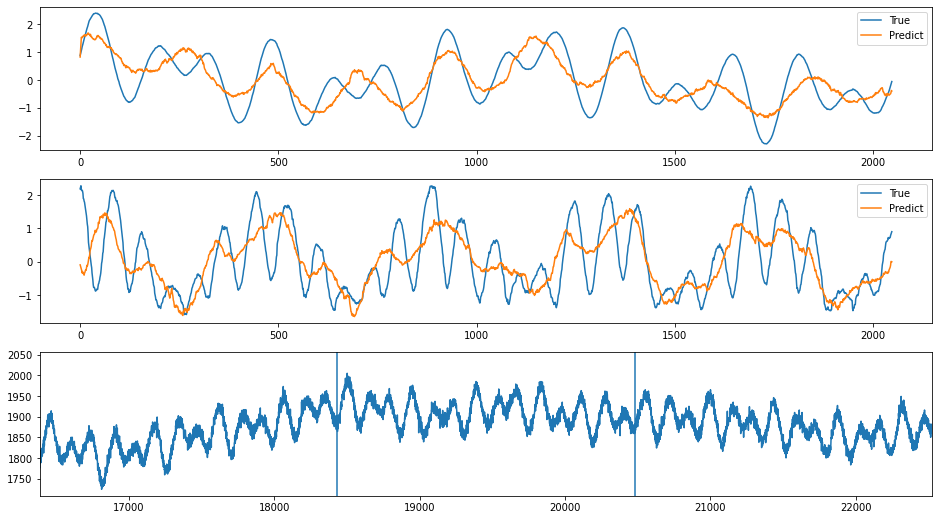

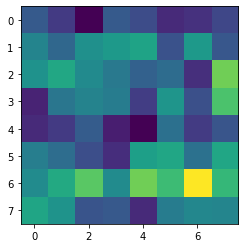

index: 336488
Error: 0.5174894081072454
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                          13
Name: 3347, dtype: object


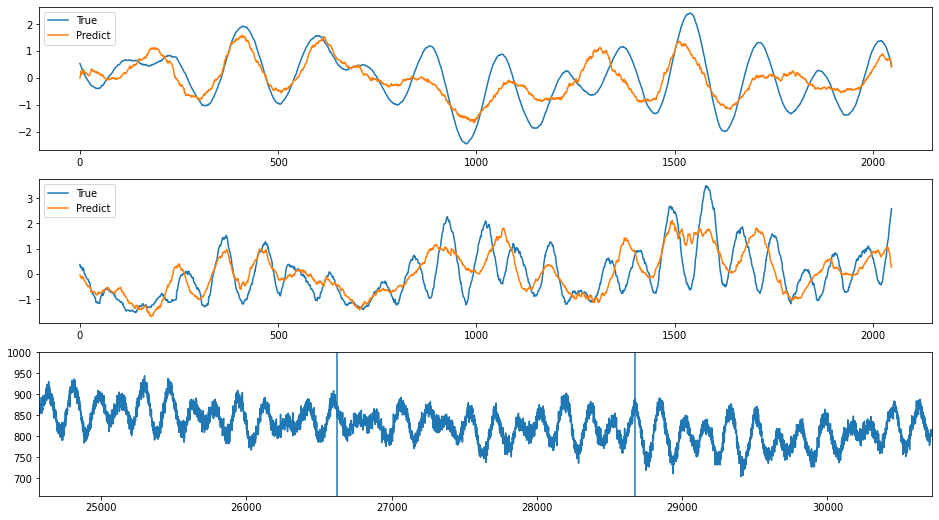

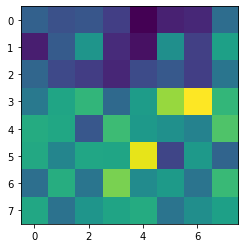

index: 54951
Error: 0.5166176522318111
type                                                         Inst
fill                                                         7383
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:15:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7383/...
n_bunches                                                     156
bunch_index                                                  1025
bunch_number                                                  123
ts_length                                                   65536
chunk                                                           6
Name: 1767, dtype: object


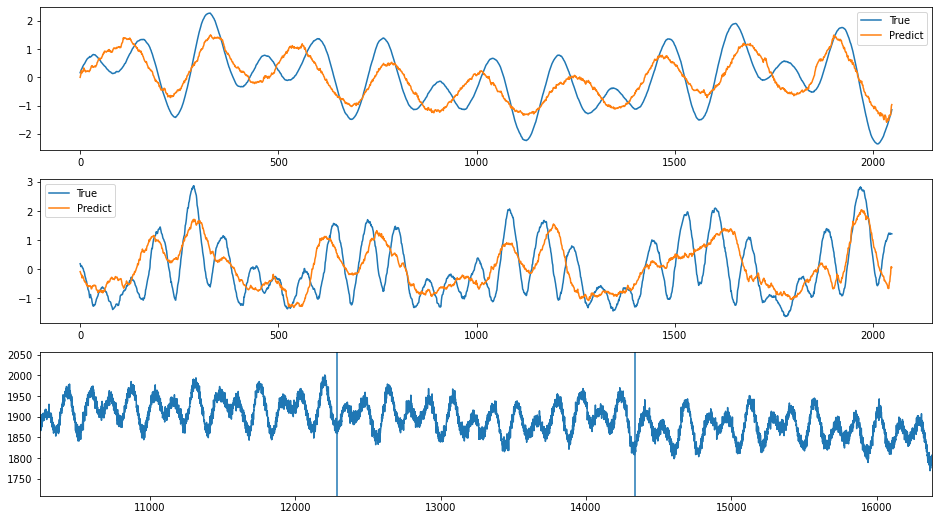

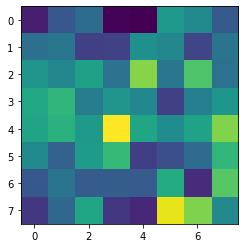

index: 113911
Error: 0.5140121778206516
type                                                         Inst
fill                                                         7095
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-28 01:58:54
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7095/...
n_bunches                                                     924
bunch_index                                                   337
bunch_number                                                  236
ts_length                                                   65536
chunk                                                          10
Name: 2601, dtype: object


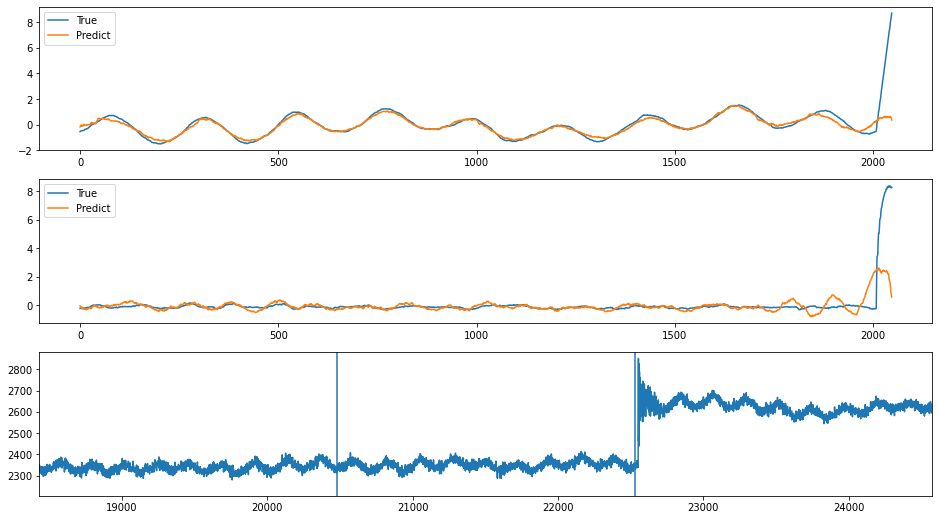

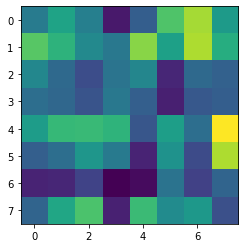

index: 328824
Error: 0.5136166019390982
type                                                         Inst
fill                                                         6859
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-28 13:36:47
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6859/...
n_bunches                                                     444
bunch_index                                                   561
bunch_number                                                  402
ts_length                                                   65536
chunk                                                          10
Name: 2681, dtype: object


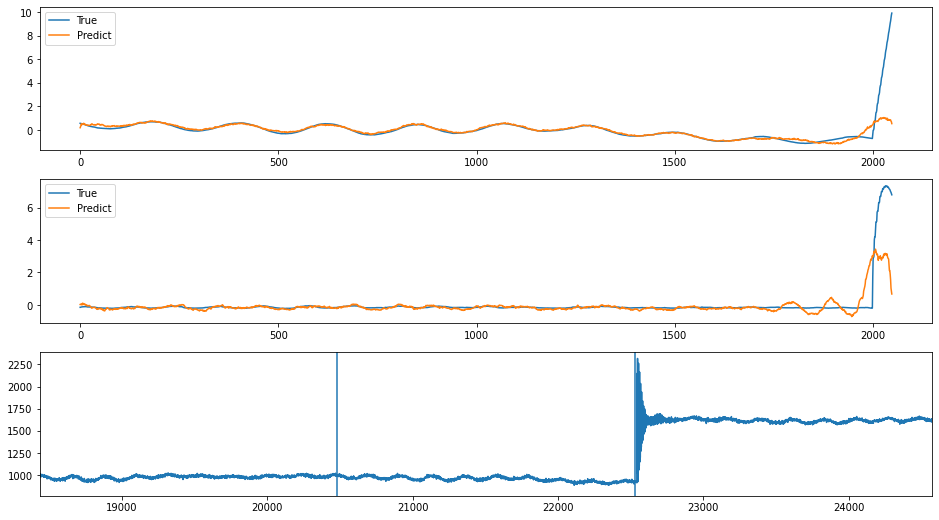

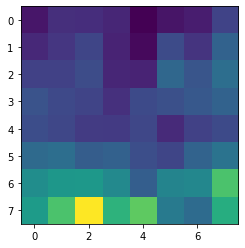

index: 225023
Error: 0.5025474884397112
type                                                         Inst
fill                                                         7362
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-26 16:18:45
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7362/...
n_bunches                                                     157
bunch_index                                                   387
bunch_number                                                  140
ts_length                                                   65536
chunk                                                          20
Name: 5156, dtype: object


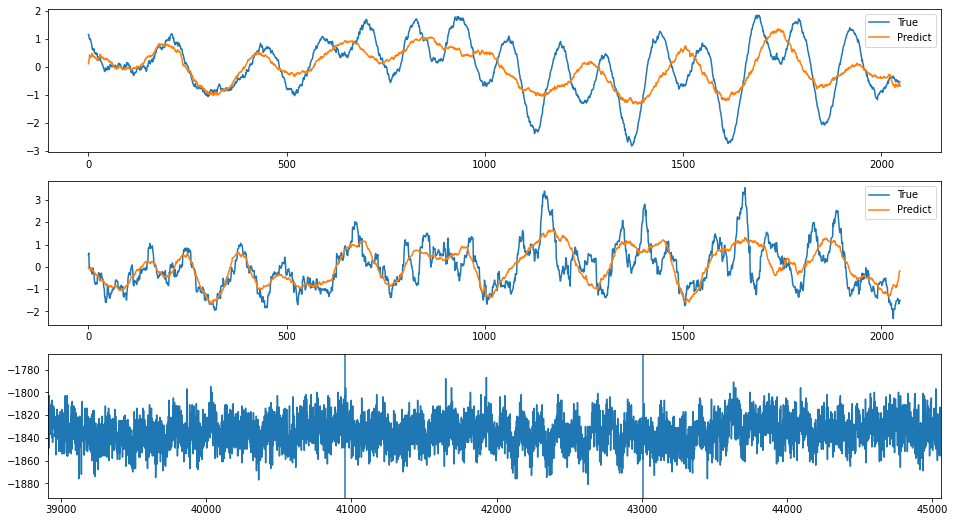

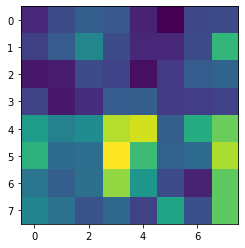

index: 277098
Error: 0.5023047483681133
type                                                         Inst
fill                                                         7047
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-12 15:30:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7047/...
n_bunches                                                     540
bunch_index                                                   577
bunch_number                                                  400
ts_length                                                   65536
chunk                                                          24
Name: 6201, dtype: object


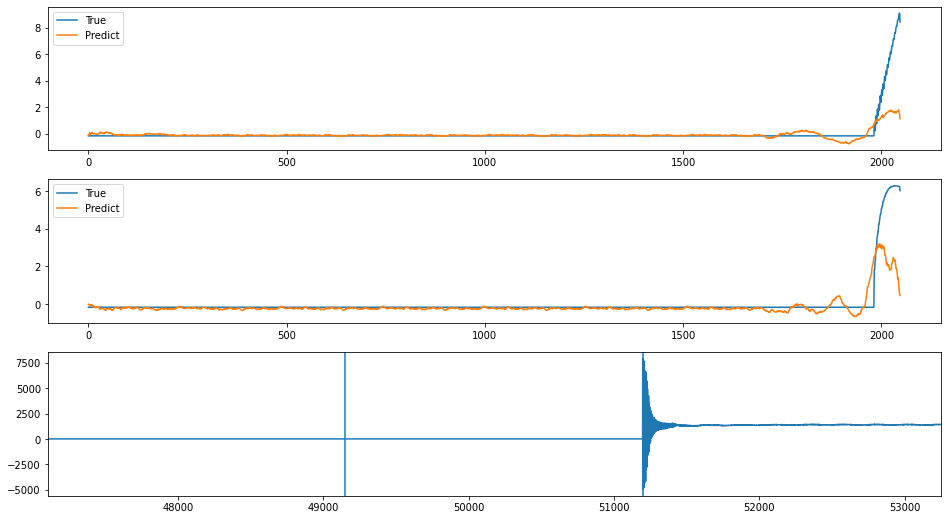

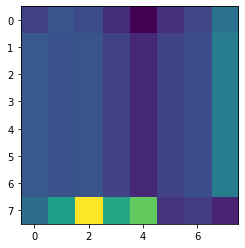

index: 133595
Error: 0.5021794728248037
type                                                         Inst
fill                                                         7384
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:48:09
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7384/...
n_bunches                                                     540
bunch_index                                                   467
bunch_number                                                  328
ts_length                                                   65536
chunk                                                          26
Name: 6680, dtype: object


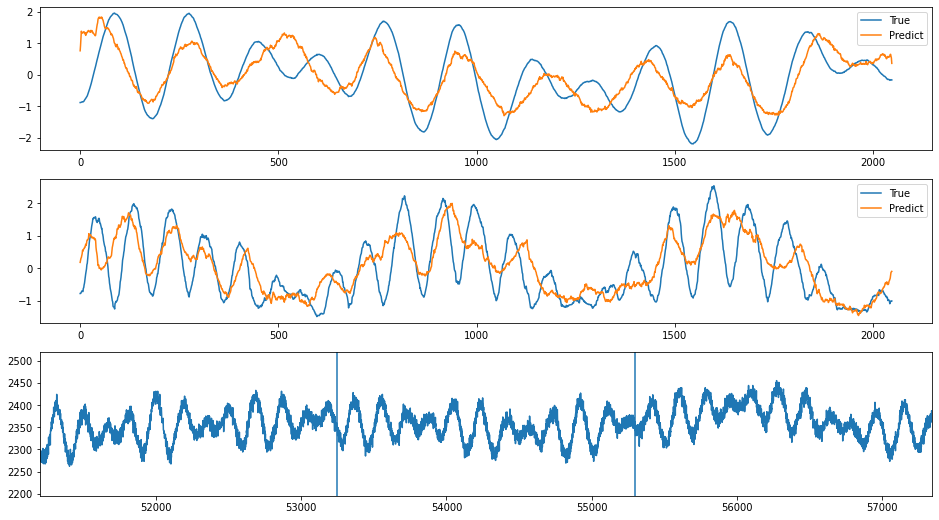

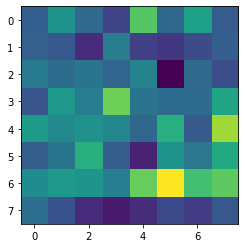

index: 231458
Error: 0.5019670310289868
type                                                         Inst
fill                                                         7047
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-12 15:30:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7047/...
n_bunches                                                     540
bunch_index                                                   671
bunch_number                                                  487
ts_length                                                   65536
chunk                                                          24
Name: 6200, dtype: object


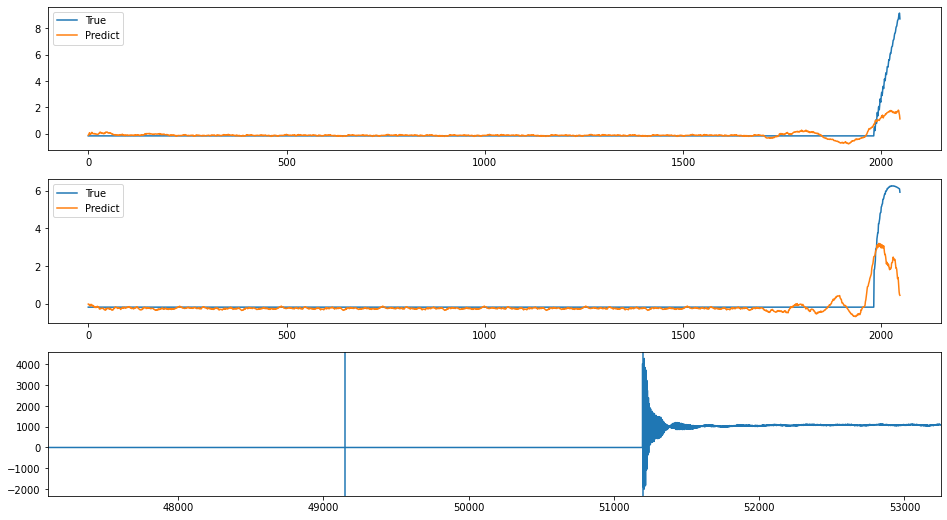

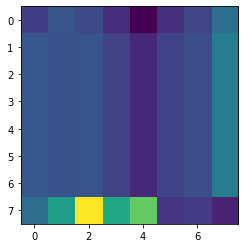

index: 129446
Error: 0.5004688302298287
type                                                         Inst
fill                                                         7384
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:48:09
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7384/...
n_bunches                                                     540
bunch_index                                                   467
bunch_number                                                  328
ts_length                                                   65536
chunk                                                          15
Name: 3864, dtype: object


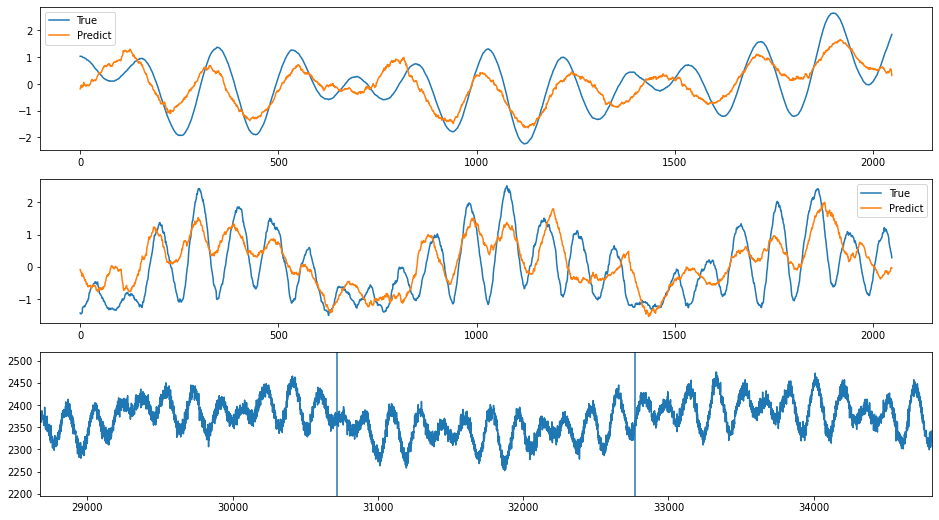

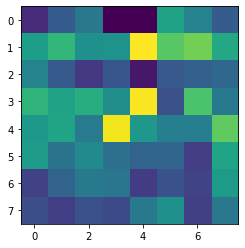

index: 15754
Error: 0.4990298132275273
type                                                         Inst
fill                                                         7382
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 01:53:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7382/...
n_bunches                                                     156
bunch_index                                                   932
bunch_number                                                   44
ts_length                                                   65536
chunk                                                          23
Name: 6004, dtype: object


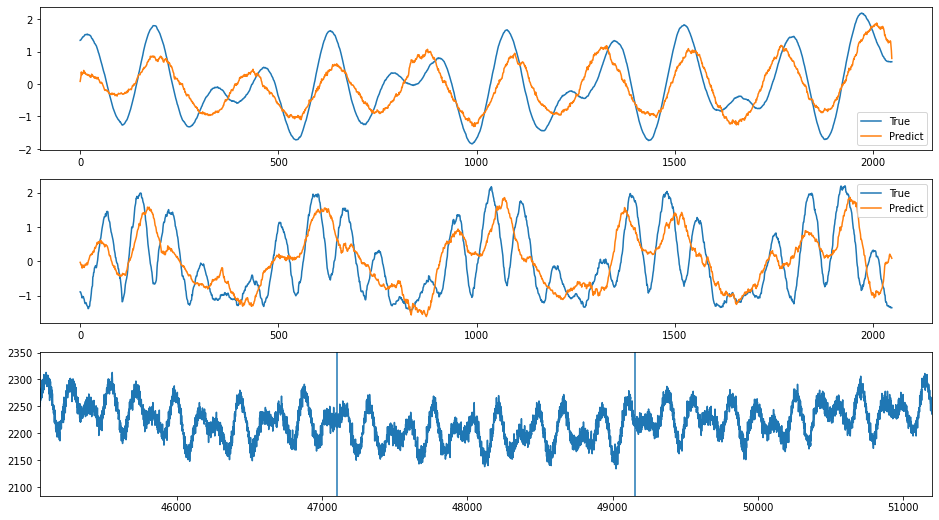

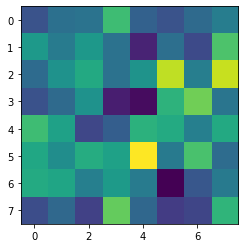

index: 337243
Error: 0.49814378228047623
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                          14
Name: 3603, dtype: object


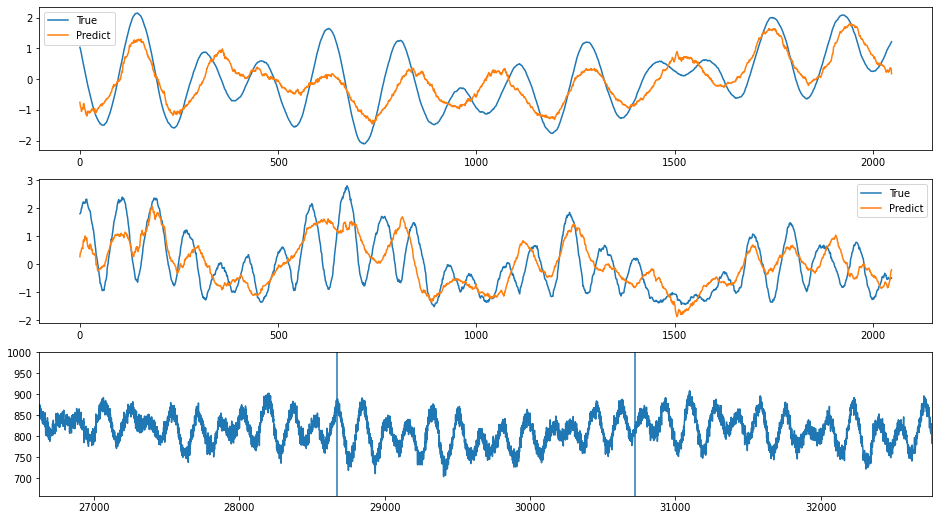

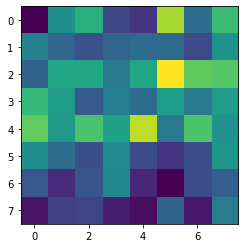

index: 9152
Error: 0.4974886788057542
type                                                         Inst
fill                                                         7382
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 01:53:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7382/...
n_bunches                                                     156
bunch_index                                                   932
bunch_number                                                   44
ts_length                                                   65536
chunk                                                          16
Name: 4212, dtype: object


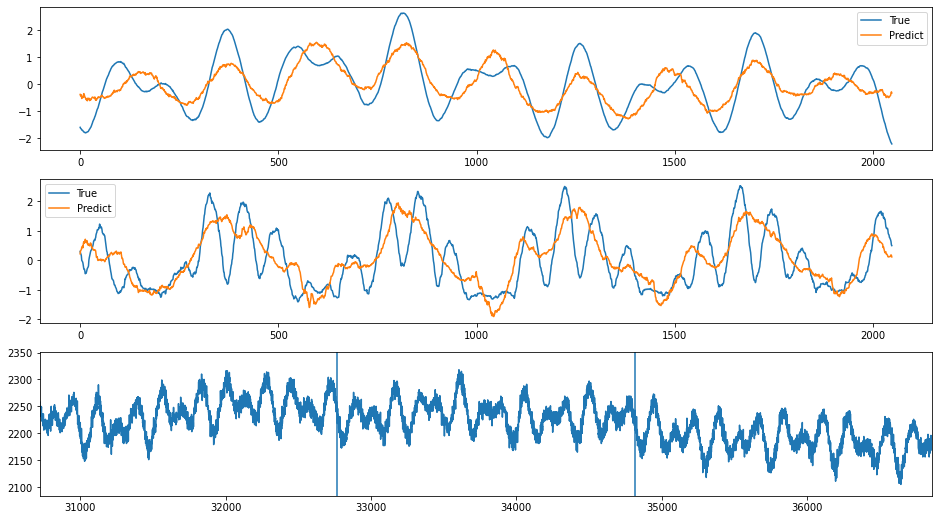

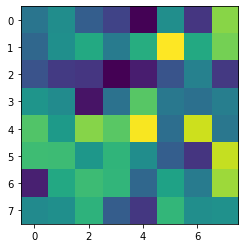

index: 333908
Error: 0.49438283363446434
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                          18
Name: 4627, dtype: object


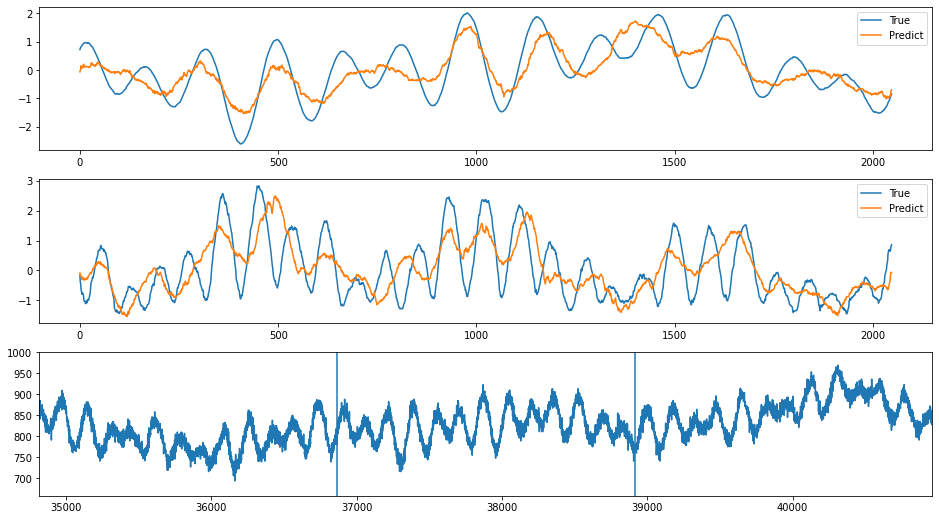

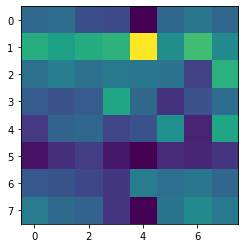

index: 183695
Error: 0.4890396860406745
type                                                         Inst
fill                                                         7088
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-26 04:25:50
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7088/...
n_bunches                                                     780
bunch_index                                                   828
bunch_number                                                  595
ts_length                                                   65536
chunk                                                          10
Name: 2579, dtype: object


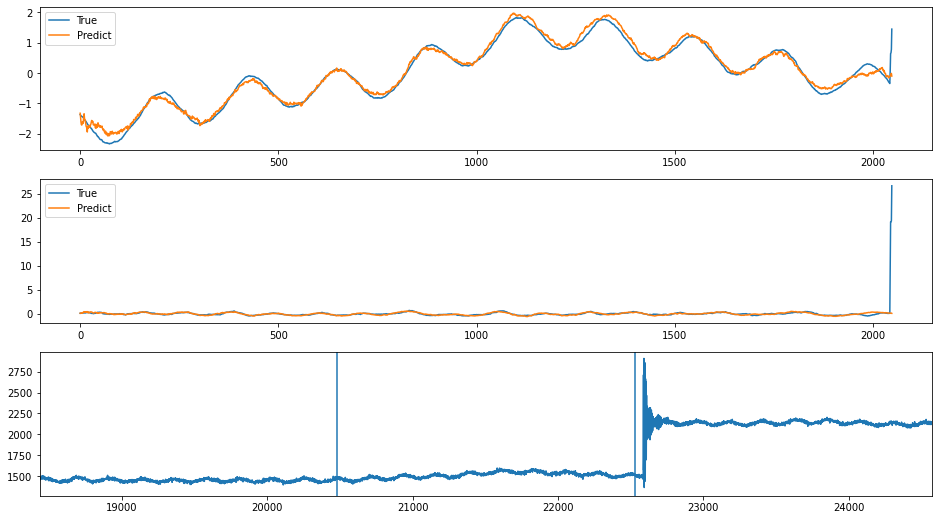

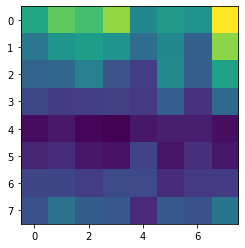

index: 54047
Error: 0.48867991121154963
type                                                         Inst
fill                                                         7383
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:15:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7383/...
n_bunches                                                     156
bunch_index                                                  1025
bunch_number                                                  123
ts_length                                                   65536
chunk                                                           3
Name: 999, dtype: object


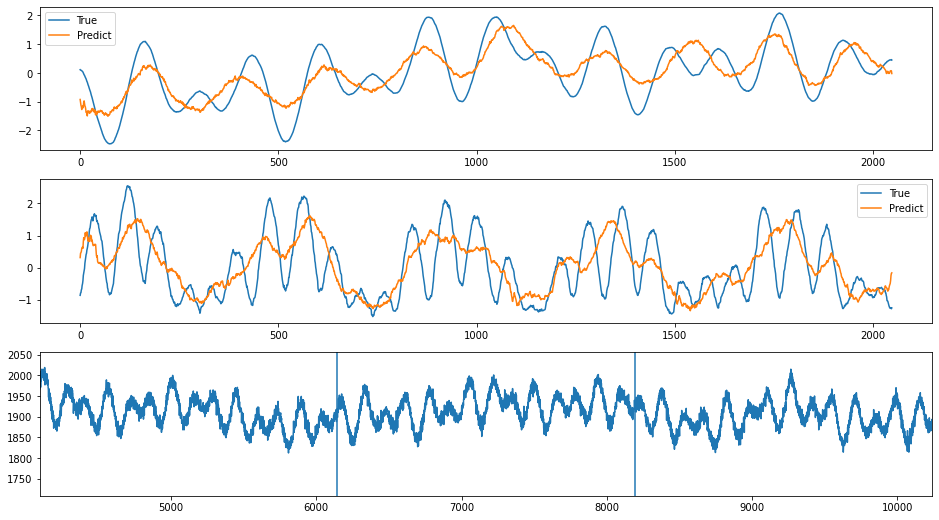

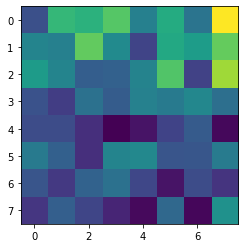

index: 333819
Error: 0.48558678701689606
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                           9
Name: 2323, dtype: object


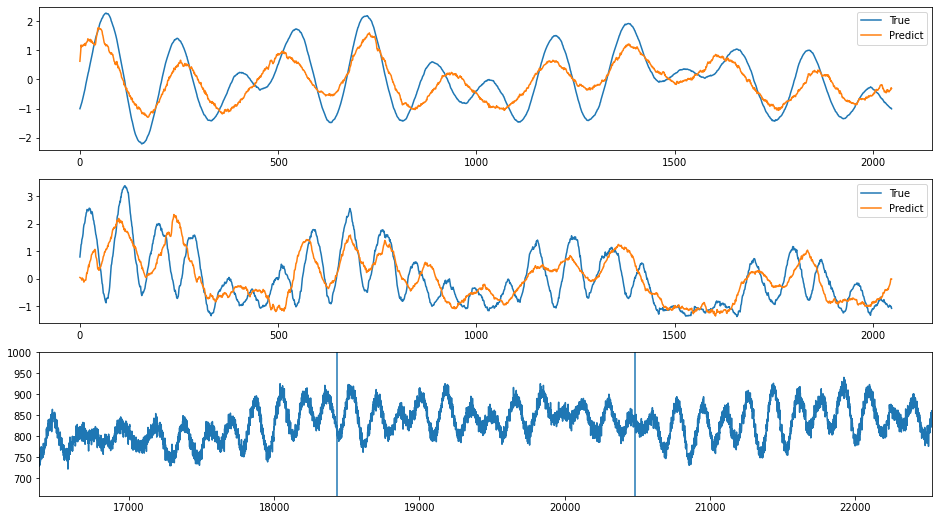

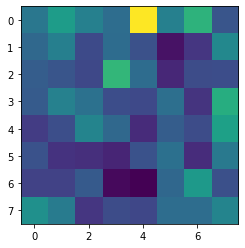

index: 9219
Error: 0.47930302952906345
type                                                         Inst
fill                                                         6370
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-09 01:08:46
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6370/...
n_bunches                                                     172
bunch_index                                                   159
bunch_number                                                   71
ts_length                                                   65536
chunk                                                           2
Name: 604, dtype: object


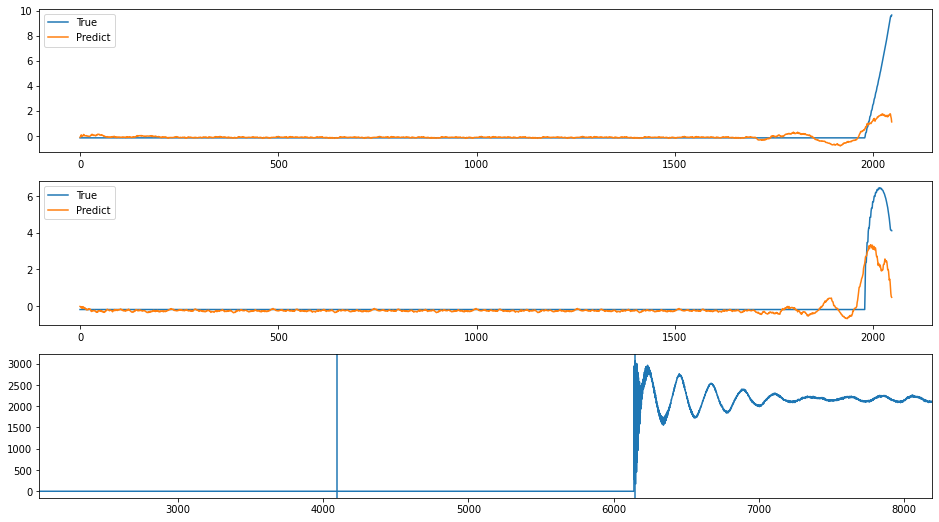

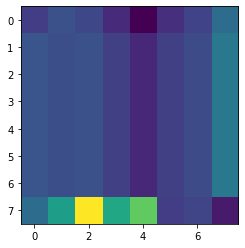

index: 55478
Error: 0.47435236878406484
type                                                         Inst
fill                                                         7383
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:15:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7383/...
n_bunches                                                     156
bunch_index                                                  1025
bunch_number                                                  123
ts_length                                                   65536
chunk                                                          10
Name: 2791, dtype: object


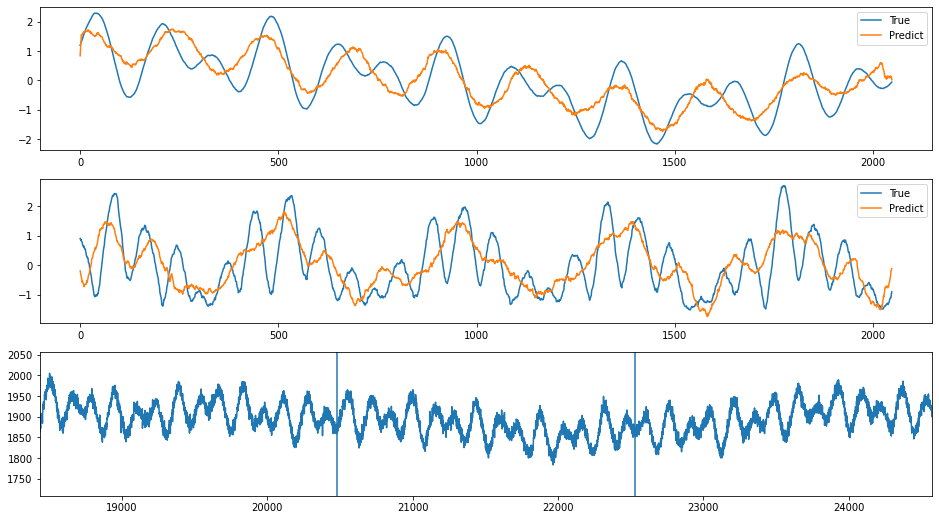

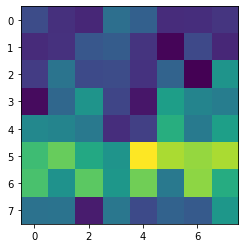

index: 11615
Error: 0.47386950810244954
type                                                         Inst
fill                                                         7382
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 01:53:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7382/...
n_bunches                                                     156
bunch_index                                                   932
bunch_number                                                   44
ts_length                                                   65536
chunk                                                          11
Name: 2932, dtype: object


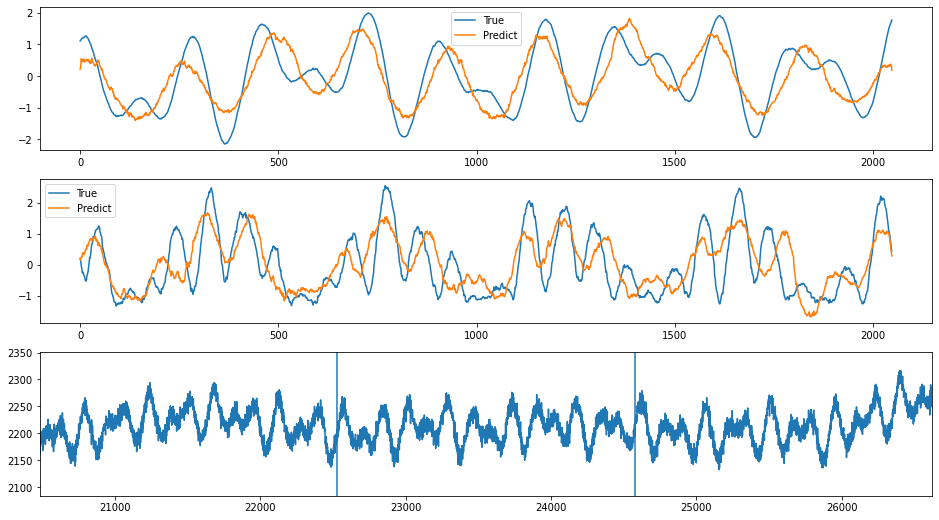

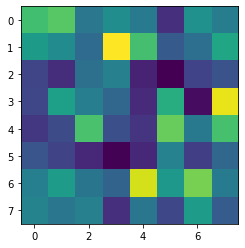

index: 337813
Error: 0.47231711137198196
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                          22
Name: 5651, dtype: object


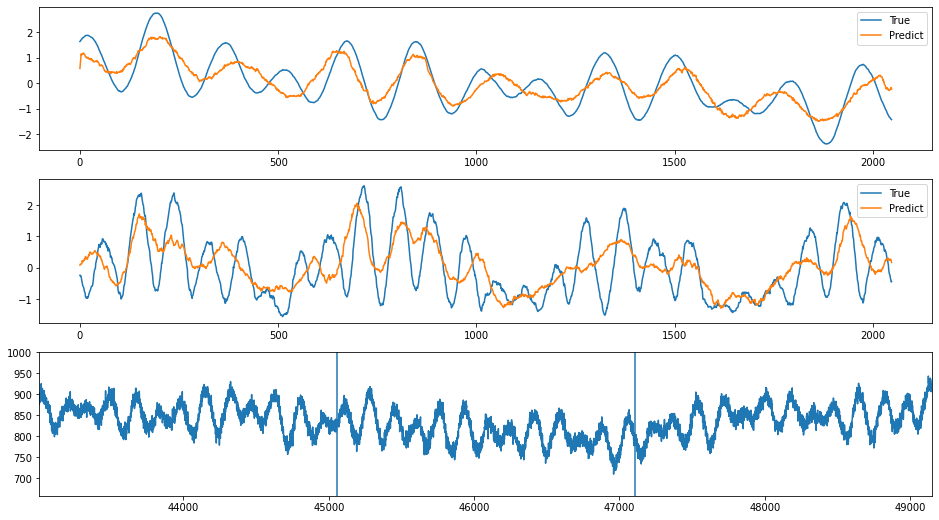

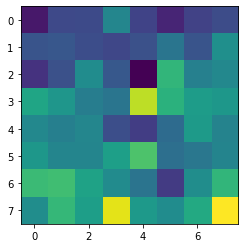

index: 54962
Error: 0.4709417809442265
type                                                         Inst
fill                                                         7383
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:15:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7383/...
n_bunches                                                     156
bunch_index                                                  1025
bunch_number                                                  123
ts_length                                                   65536
chunk                                                           4
Name: 1255, dtype: object


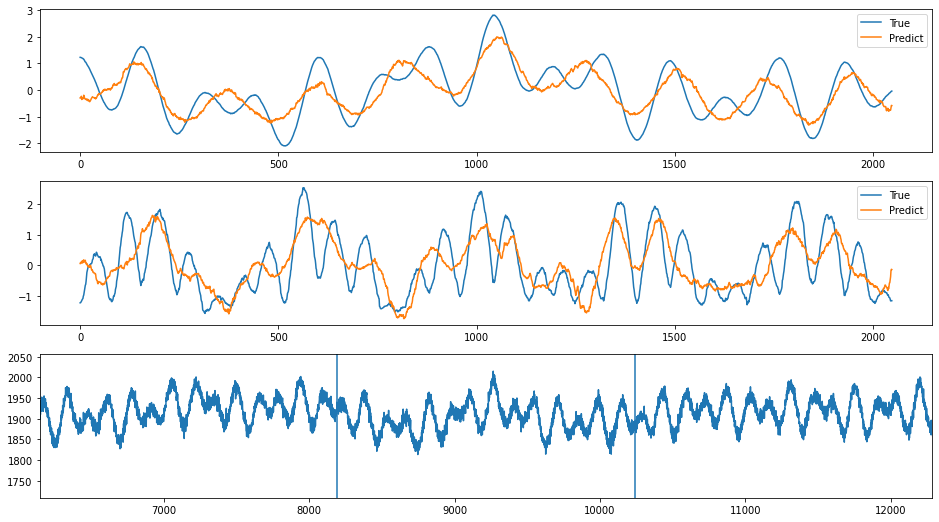

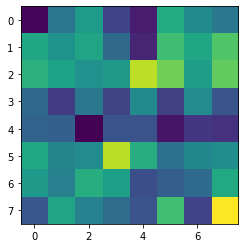

index: 311914
Error: 0.4699782339386229
type                                                         Inst
fill                                                         6436
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-30 05:28:17
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6436/...
n_bunches                                                     408
bunch_index                                                   909
bunch_number                                                   38
ts_length                                                   65536
chunk                                                          20
Name: 5219, dtype: object


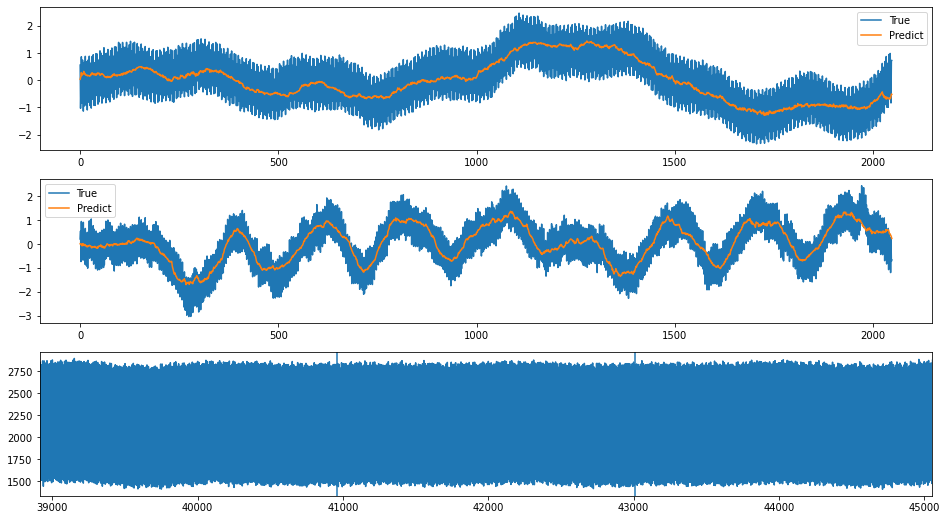

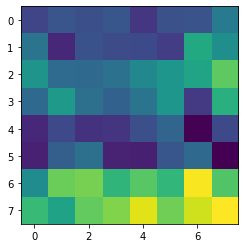

index: 129550
Error: 0.46907903820256236
type                                                         Inst
fill                                                         7384
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:48:09
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7384/...
n_bunches                                                     540
bunch_index                                                   467
bunch_number                                                  328
ts_length                                                   65536
chunk                                                          18
Name: 4632, dtype: object


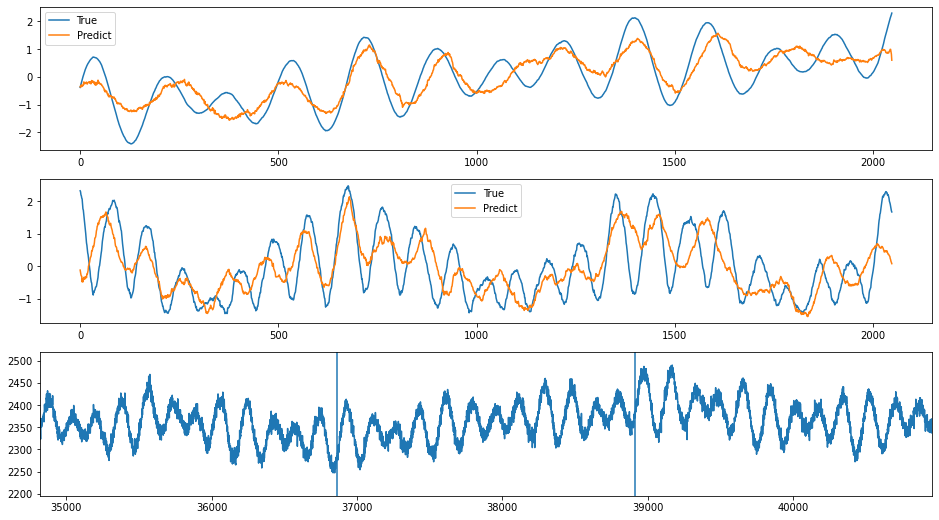

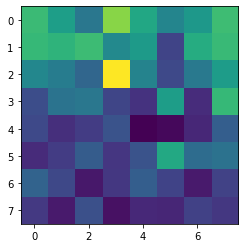

index: 341114
Error: 0.4682913941128036
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                          25
Name: 6419, dtype: object


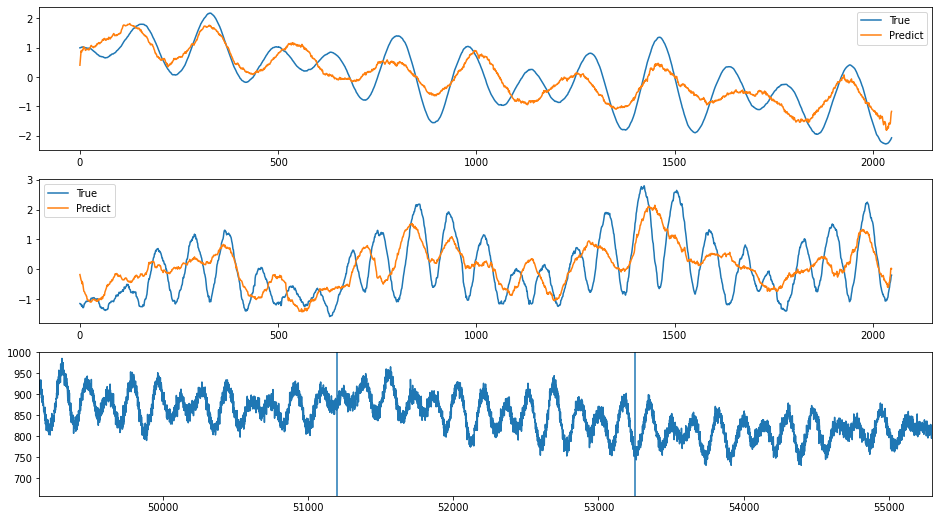

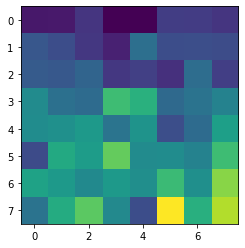

index: 8433
Error: 0.46483166934429815
type                                                         Inst
fill                                                         7382
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 01:53:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7382/...
n_bunches                                                     156
bunch_index                                                   932
bunch_number                                                   44
ts_length                                                   65536
chunk                                                          24
Name: 6260, dtype: object


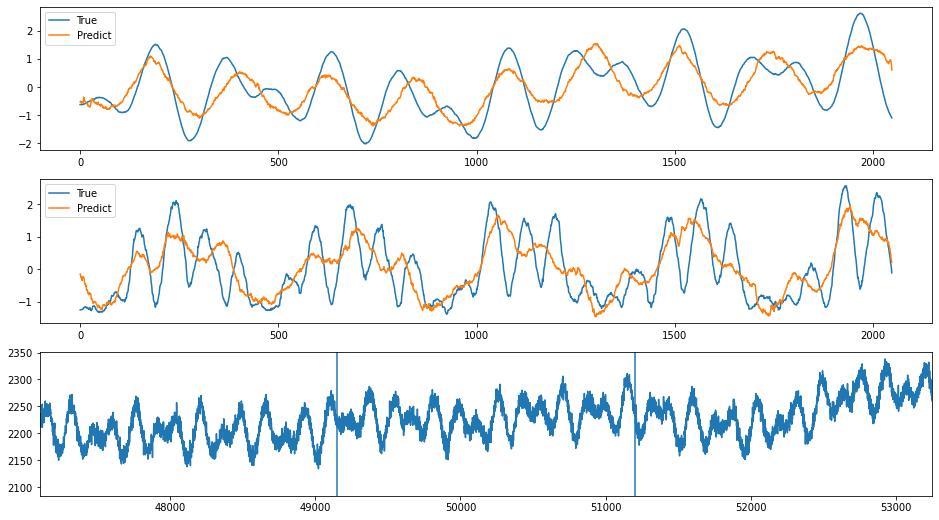

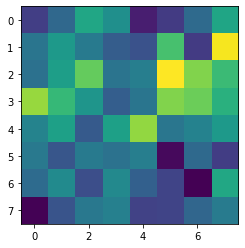

index: 341129
Error: 0.4644562838776544
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                          16
Name: 4115, dtype: object


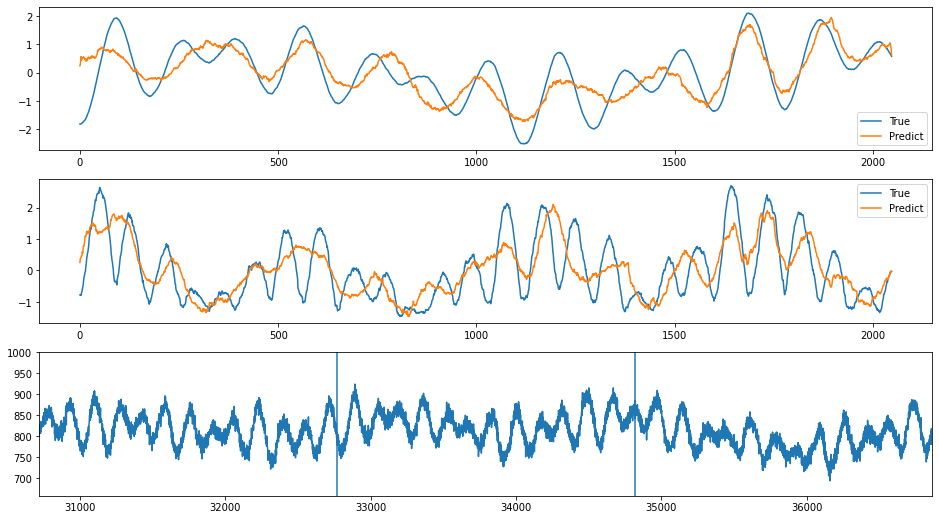

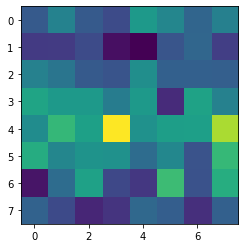

index: 132755
Error: 0.46416742504053987
type                                                         Inst
fill                                                         7384
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:48:09
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7384/...
n_bunches                                                     540
bunch_index                                                   467
bunch_number                                                  328
ts_length                                                   65536
chunk                                                          16
Name: 4120, dtype: object


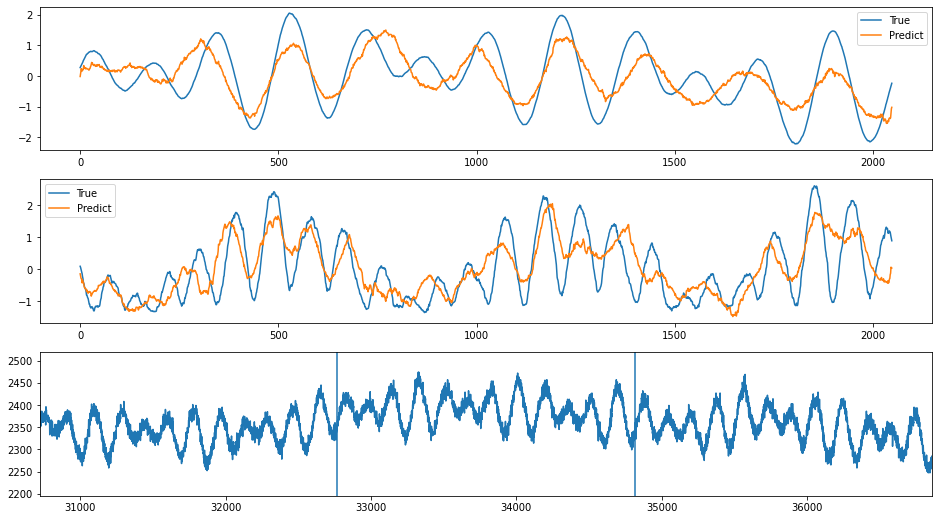

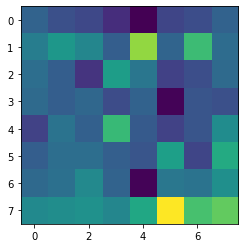

index: 131427
Error: 0.4636119451804702
type                                                         Inst
fill                                                         7384
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:48:09
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7384/...
n_bunches                                                     540
bunch_index                                                   467
bunch_number                                                  328
ts_length                                                   65536
chunk                                                          17
Name: 4376, dtype: object


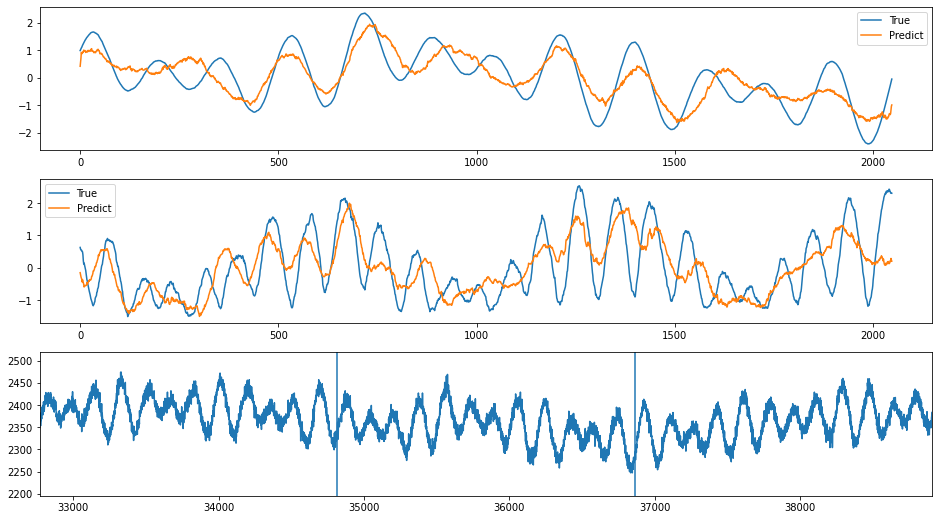

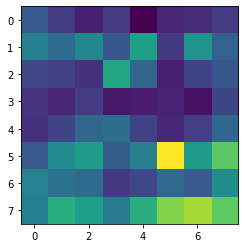

index: 339076
Error: 0.4620772710008111
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                           5
Name: 1299, dtype: object


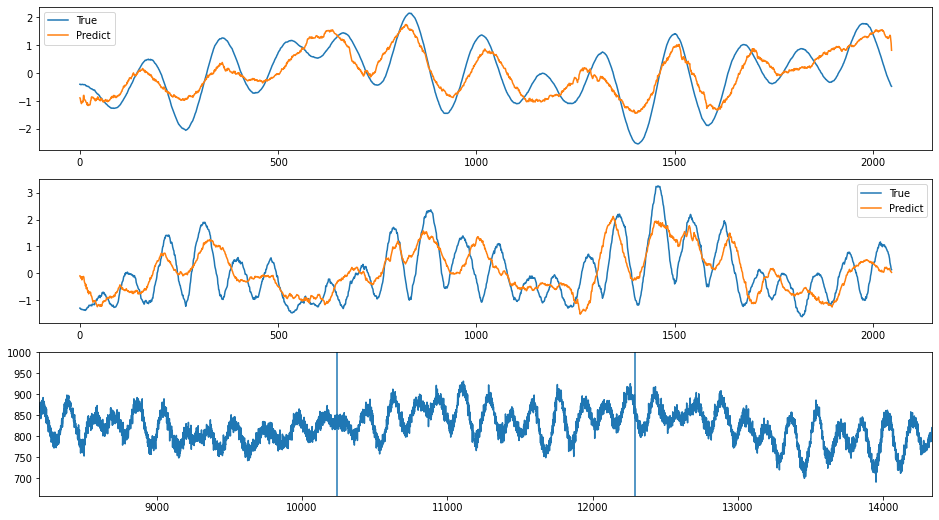

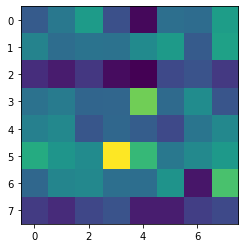

index: 11578
Error: 0.4573152223575334
type                                                         Inst
fill                                                         7382
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 01:53:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7382/...
n_bunches                                                     156
bunch_index                                                   932
bunch_number                                                   44
ts_length                                                   65536
chunk                                                          17
Name: 4468, dtype: object


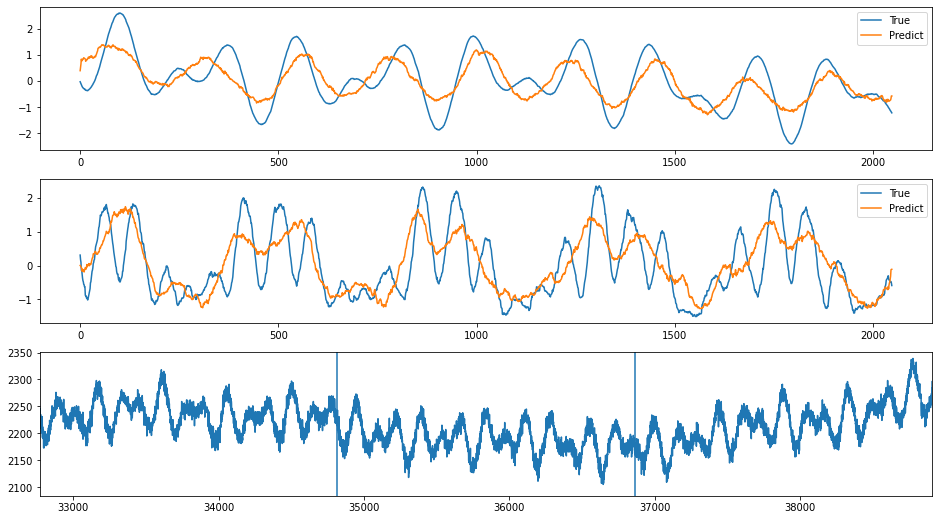

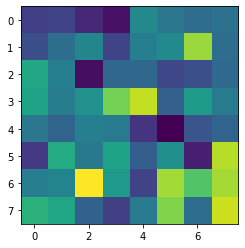

index: 338582
Error: 0.4564653780013558
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                           2
Name: 531, dtype: object


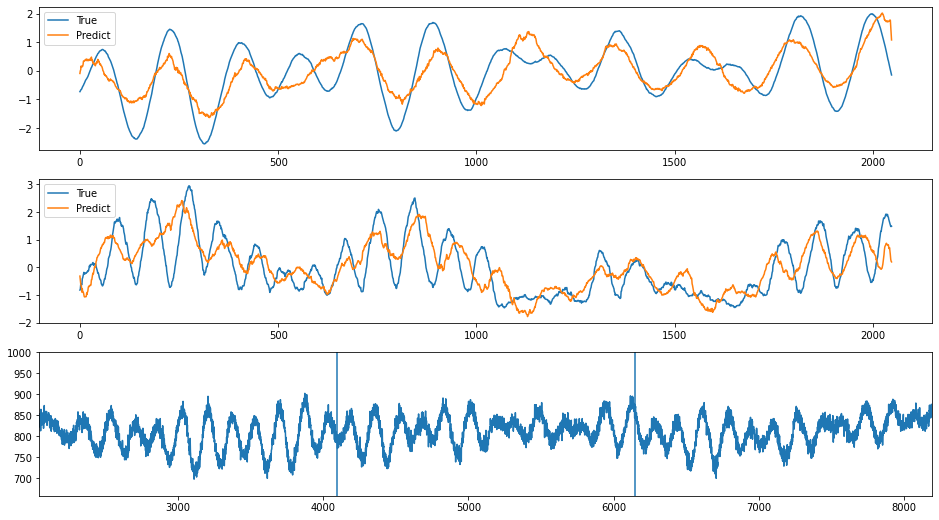

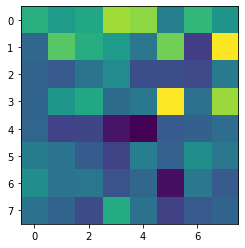

index: 184235
Error: 0.45395317206581
type                                                         Inst
fill                                                         7088
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-26 04:25:50
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7088/...
n_bunches                                                     780
bunch_index                                                   828
bunch_number                                                  595
ts_length                                                   65536
chunk                                                          11
Name: 2835, dtype: object


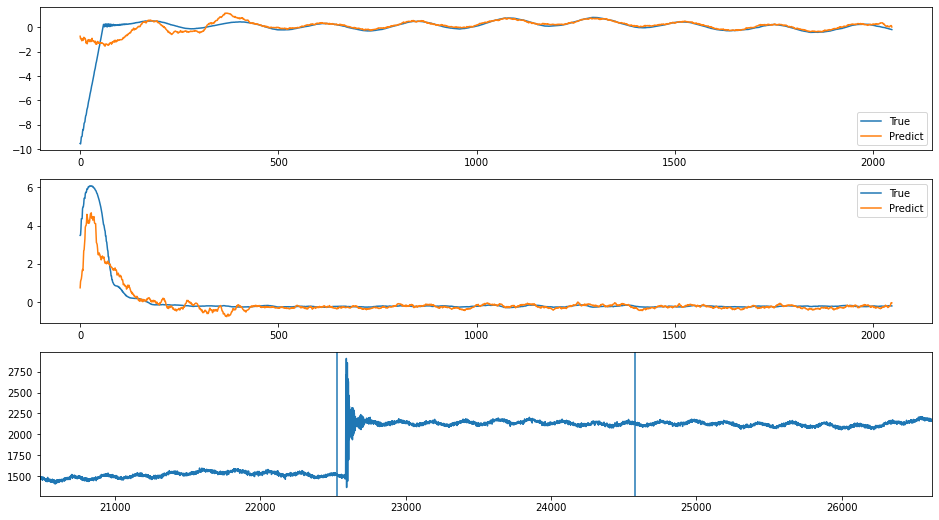

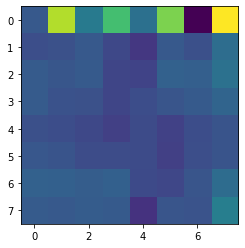

index: 53069
Error: 0.4526840408426007
type                                                         Inst
fill                                                         7383
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:15:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7383/...
n_bunches                                                     156
bunch_index                                                  1025
bunch_number                                                  123
ts_length                                                   65536
chunk                                                          12
Name: 3303, dtype: object


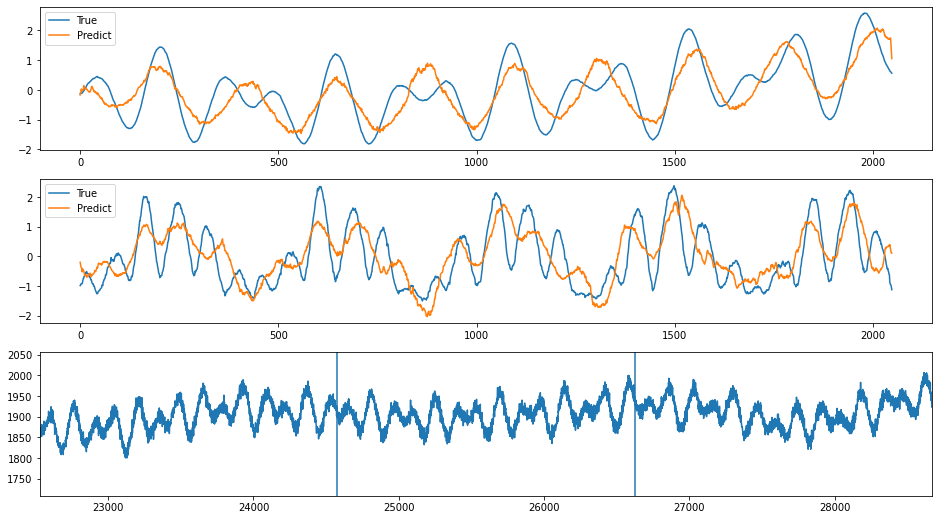

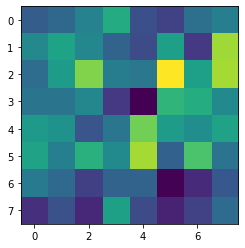

index: 131741
Error: 0.4512890295602247
type                                                         Inst
fill                                                         7384
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:48:09
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7384/...
n_bunches                                                     540
bunch_index                                                   467
bunch_number                                                  328
ts_length                                                   65536
chunk                                                          24
Name: 6168, dtype: object


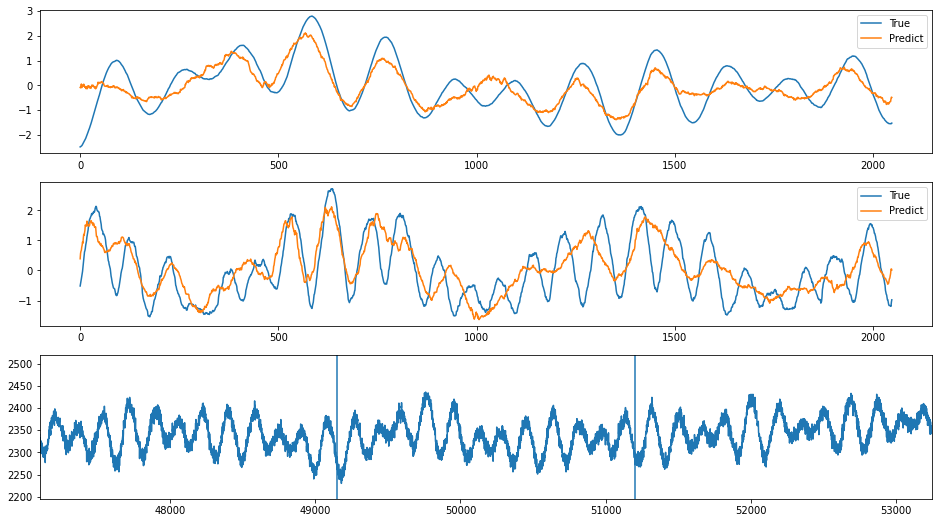

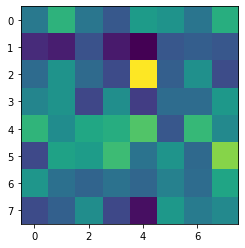

index: 333346
Error: 0.4500841167384358
type                                                         Inst
fill                                                         7178
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-15 15:29:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7178/...
n_bunches                                                     300
bunch_index                                                   446
bunch_number                                                  211
ts_length                                                   65536
chunk                                                          28
Name: 7187, dtype: object


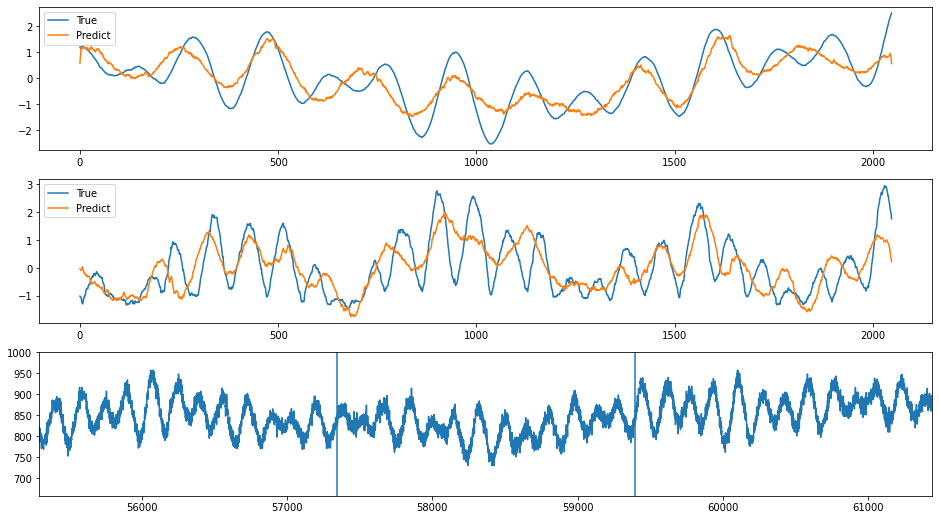

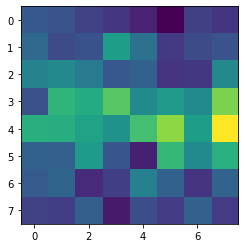

index: 48879
Error: 0.44988978432190074
type                                                         Inst
fill                                                         7383
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 02:15:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7383/...
n_bunches                                                     156
bunch_index                                                  1025
bunch_number                                                  123
ts_length                                                   65536
chunk                                                           2
Name: 743, dtype: object


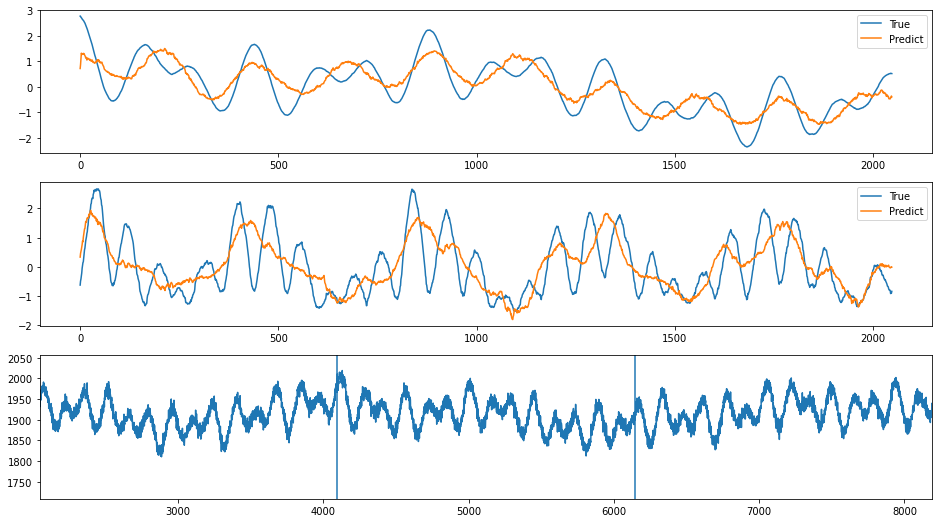

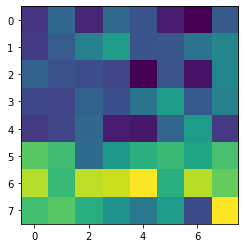

In [26]:
for i in range(1, 51):
    index = sorted_error_indices[-i]
    plot_train_index(index)

# Around the peak

In [27]:
error_around_peak = abs(train_error - hist_peak)
sorted_error_indices_around_peak = np.argsort(error_around_peak)

index: 185476
Error: 0.11158246184205889
type                                                         Inst
fill                                                         7378
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-28 23:48:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7378/...
n_bunches                                                     456
bunch_index                                                  1374
bunch_number                                                  401
ts_length                                                   65536
chunk                                                          28
Name: 7316, dtype: object


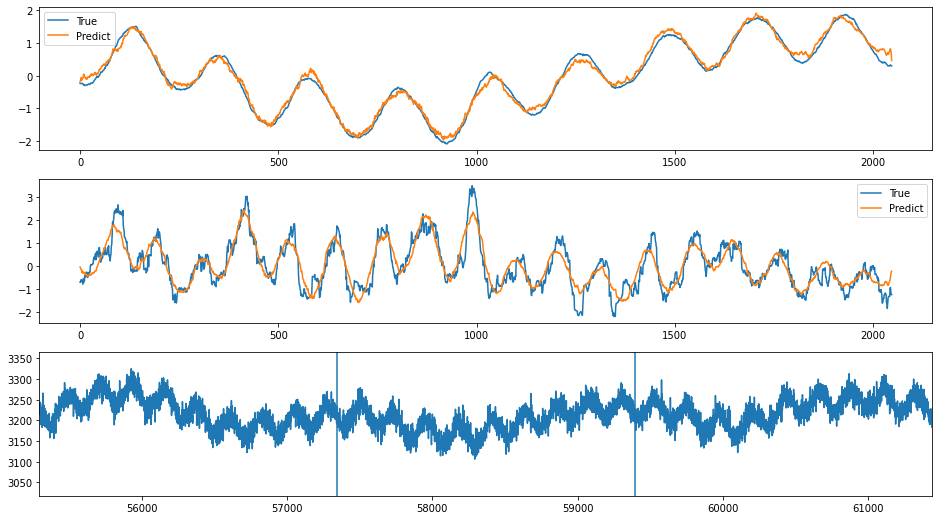

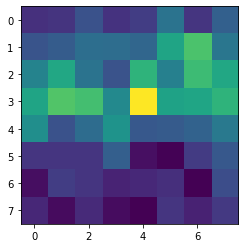

index: 26287
Error: 0.1115826687186028
type                                                         Inst
fill                                                         6411
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-22 22:38:19
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6411/...
n_bunches                                                    1868
bunch_index                                                  1915
bunch_number                                                 1019
ts_length                                                   65536
chunk                                                          20
Name: 5217, dtype: object


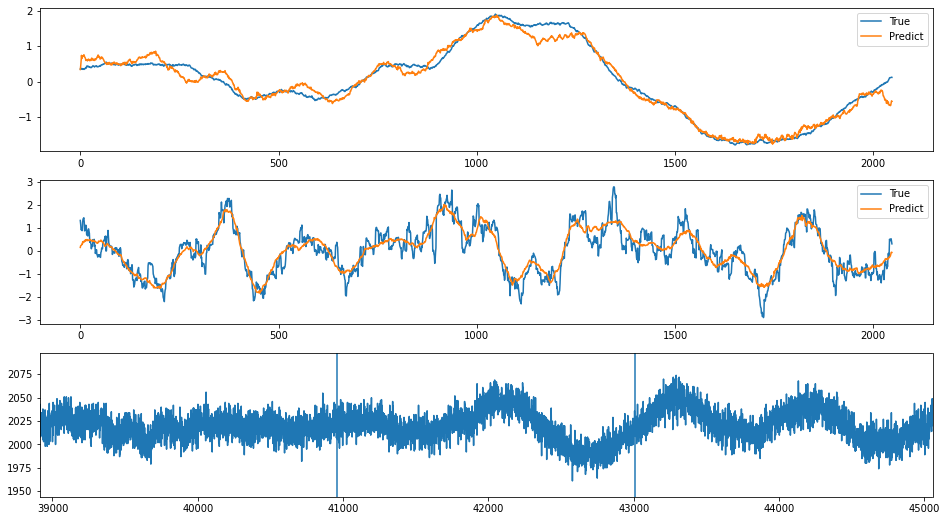

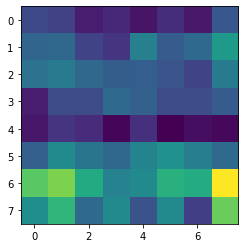

index: 263986
Error: 0.11158295096248946
type                                                         Inst
fill                                                         6712
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-22 17:30:57
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6712/...
n_bunches                                                     396
bunch_index                                                   231
bunch_number                                                  125
ts_length                                                   65536
chunk                                                          28
Name: 7397, dtype: object


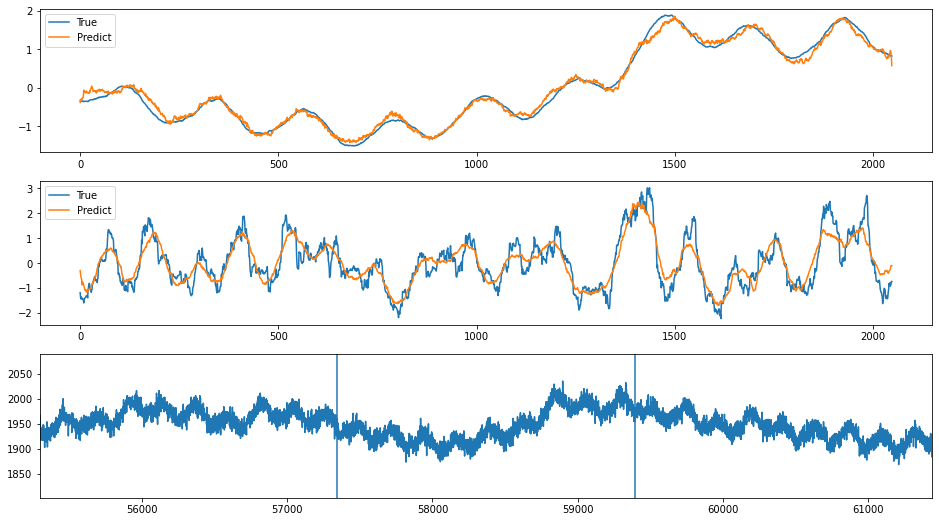

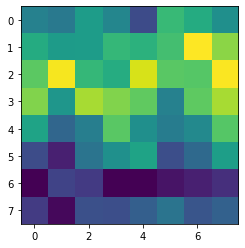

index: 277432
Error: 0.11158144204561743
type                                                         Inst
fill                                                         6215
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 00:42:13
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6215/...
n_bunches                                                    2556
bunch_index                                                  1730
bunch_number                                                 1281
ts_length                                                   65536
chunk                                                          11
Name: 3001, dtype: object


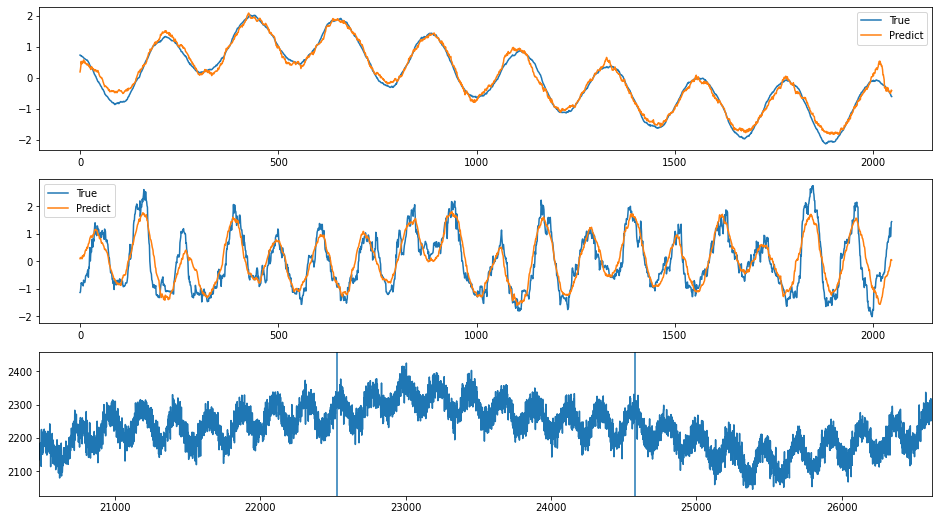

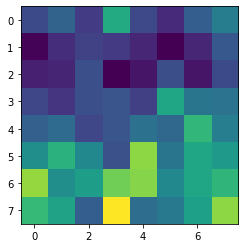

index: 40890
Error: 0.11158138490649655
type                                                         Inst
fill                                                         6344
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-29 02:38:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6344/...
n_bunches                                                    1868
bunch_index                                                  1306
bunch_number                                                  701
ts_length                                                   65536
chunk                                                          13
Name: 3392, dtype: object


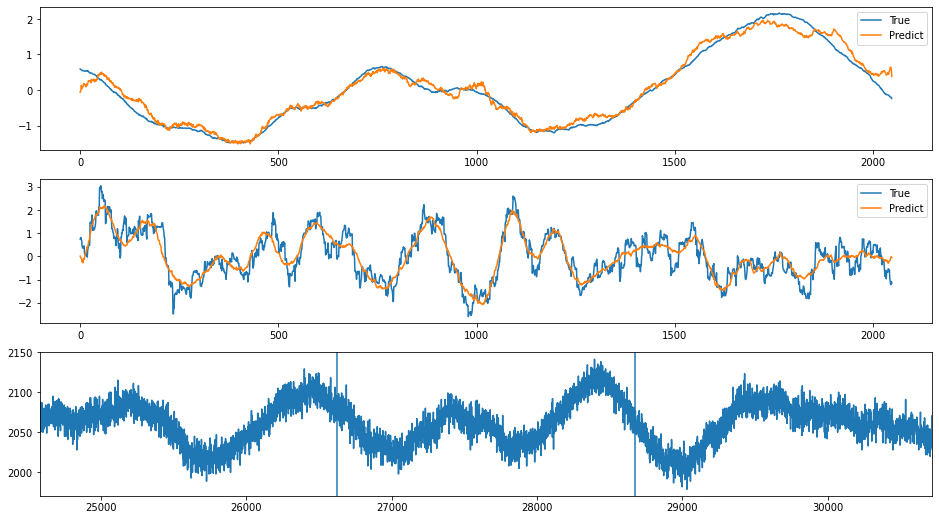

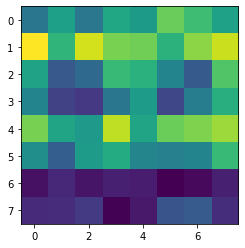

index: 392340
Error: 0.11158137799201091
type                                                         Inst
fill                                                         6956
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-21 09:11:08
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6956/...
n_bunches                                                     780
bunch_index                                                   494
bunch_number                                                  348
ts_length                                                   65536
chunk                                                          16
Name: 4134, dtype: object


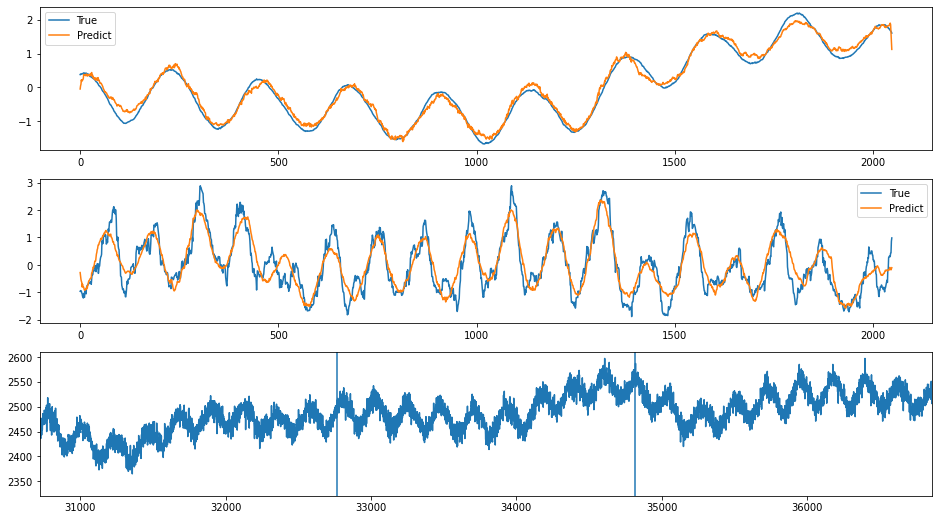

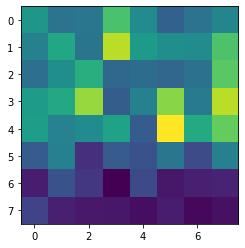

index: 89146
Error: 0.11158382447468919
type                                                         Inst
fill                                                         6890
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-05 23:34:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6890/...
n_bunches                                                    1452
bunch_index                                                  2938
bunch_number                                                 1245
ts_length                                                   65536
chunk                                                          27
Name: 7088, dtype: object


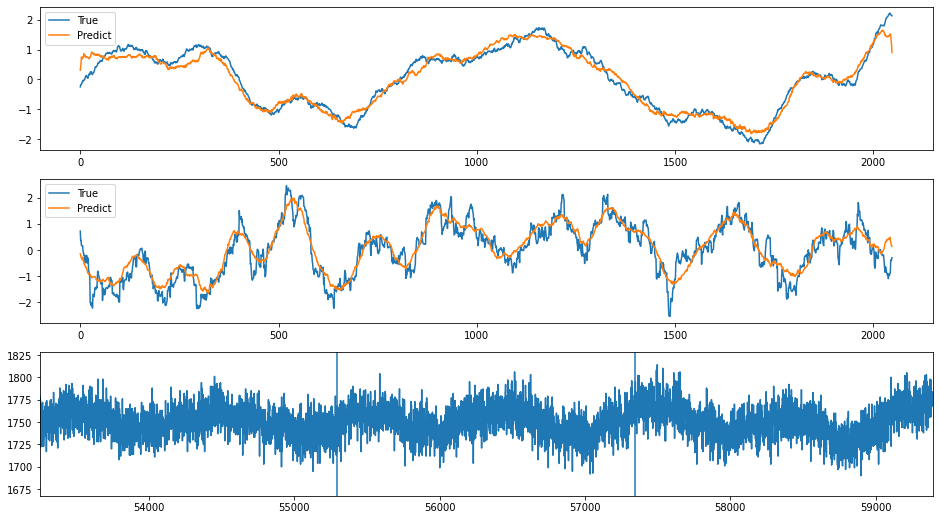

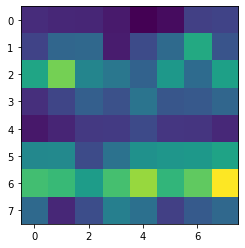

index: 152371
Error: 0.11158399828346707
type                                                         Inst
fill                                                         6757
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-04 14:04:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6757/...
n_bunches                                                    2556
bunch_index                                                  2784
bunch_number                                                 2050
ts_length                                                   65536
chunk                                                          24
Name: 6274, dtype: object


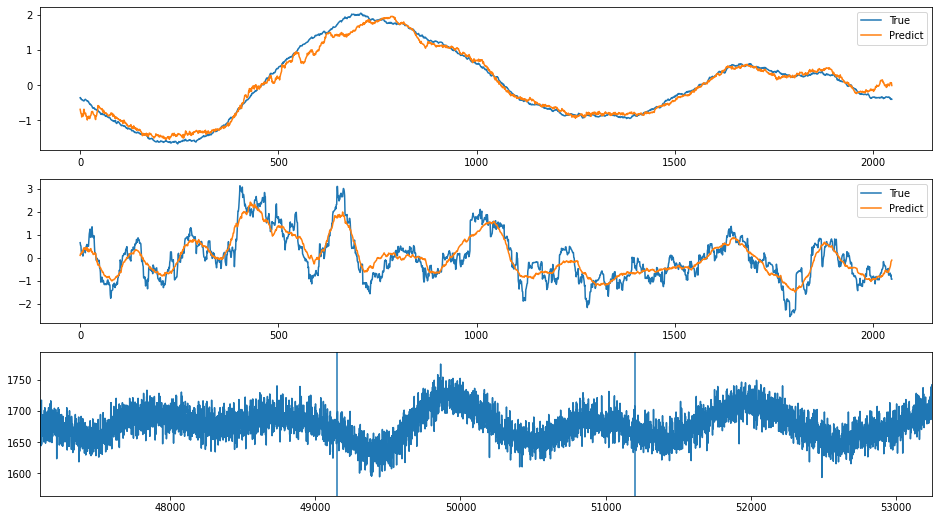

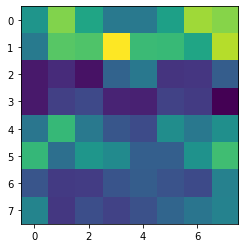

index: 63514
Error: 0.11158417970627171
type                                                         Inst
fill                                                         7052
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-13 22:44:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7052/...
n_bunches                                                    2556
bunch_index                                                  1124
bunch_number                                                  815
ts_length                                                   65536
chunk                                                          19
Name: 5056, dtype: object


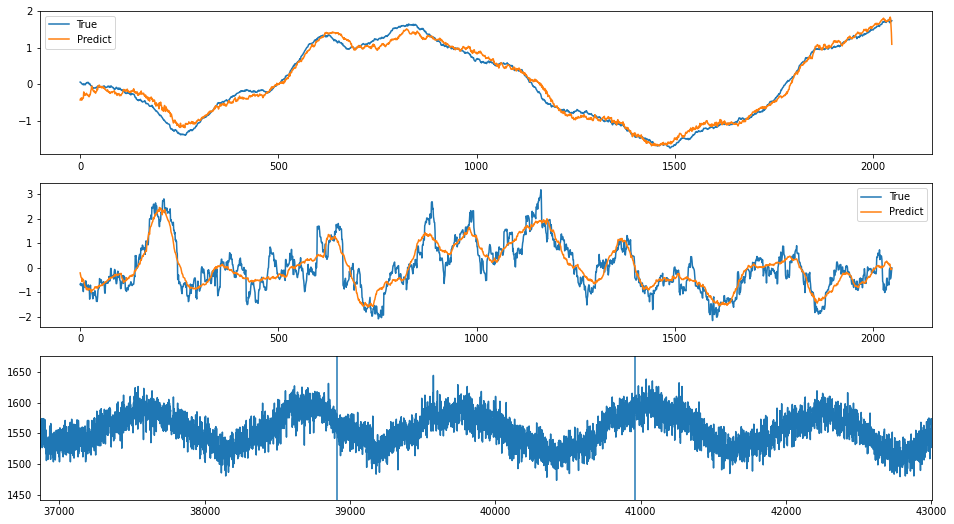

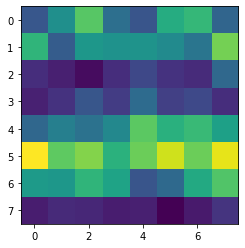

index: 87556
Error: 0.11158434550851207
type                                                         Inst
fill                                                         6272
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-05 08:14:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/...
n_bunches                                                    1836
bunch_index                                                  3039
bunch_number                                                 1624
ts_length                                                   65536
chunk                                                          10
Name: 2562, dtype: object


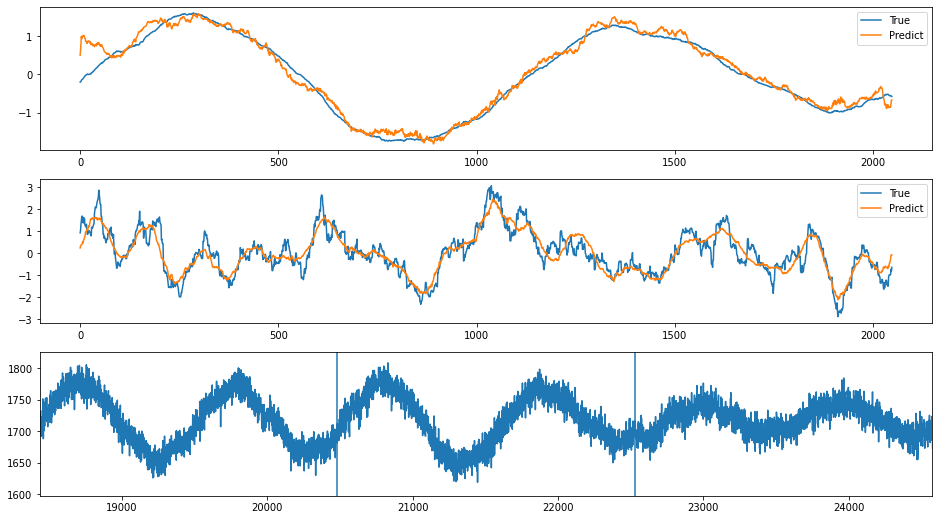

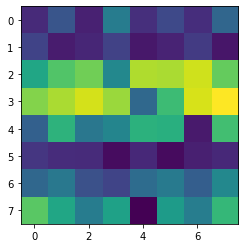

In [28]:
for i in range(10):
    index = sorted_error_indices_around_peak[i]
    plot_train_index(index)

# Around a point

In [29]:
# point = 

In [30]:
# error_around_peak = abs(train_error - point)
# sorted_error_indices_around_point = np.argsort(error_around_peak)

In [31]:
# for i in range(10):
#     index = sorted_error_indices_around_point[i]
#     plot_train_index(index)

# Clustering

In [32]:
indices = sorted_error_indices[-np.arange(1, 1024+1)]
encoding_true = train_data[indices]
encoding_pred = train_prediction[indices]
encoding_meta = train_meta.iloc[indices]
encoded = checker.encode(encoding_true)
encoded_2d = encoded.reshape(encoded.shape[0], -1)

In [33]:
encoded_2d.shape

(1024, 64)

In [34]:
def plot_clusters(cluster_indices):
    print(f"N samples: {len(cluster_indices)}")
    fig, axes = plt.subplots(2,1, figsize=(12, 3))
    axes[0].plot(encoding_true[cluster_indices][:,:, 0].T, linewidth=0, marker=',', alpha=0.1)
    axes[1].plot(encoding_true[cluster_indices][:,:, 1].T, linewidth=0, marker=',', alpha=0.1)
    return fig, axes

In [35]:
import sklearn
from sklearn.manifold import TSNE

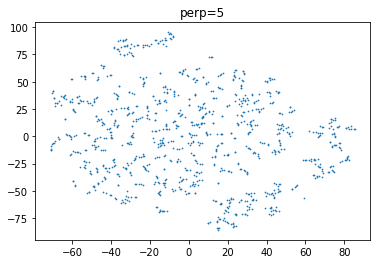

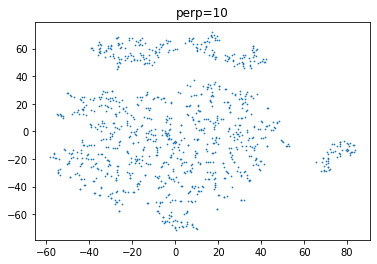

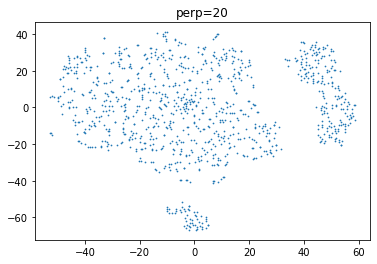

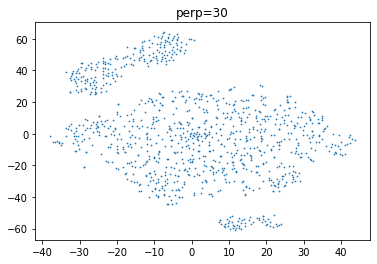

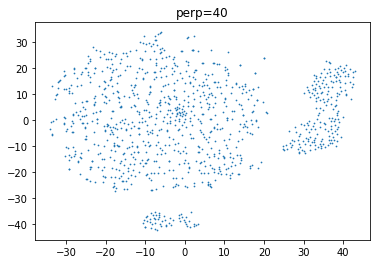

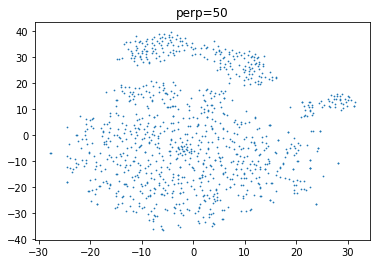

In [36]:
for perplexity in [5, 10, 20, 30, 40, 50]: 
    tsne = TSNE(perplexity=perplexity)
    encoded_2d_tsne = tsne.fit_transform(encoded_2d)
    plt.scatter(encoded_2d_tsne[:, 0], encoded_2d_tsne[:, 1], marker='.', s=2)
    plt.title(f"perp={perplexity}")
    plt.show()

In [37]:
tsne = TSNE(perplexity=30)
encoded_2d_tsne = tsne.fit_transform(encoded_2d)

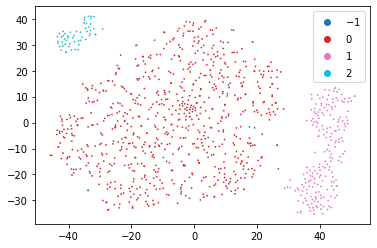

cluster -1
N samples: 16


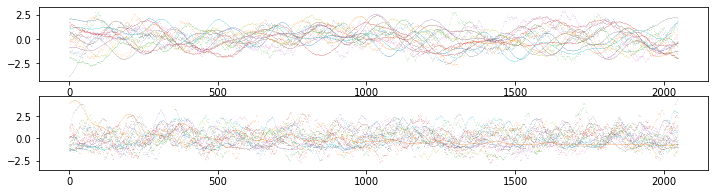

cluster 0
N samples: 754


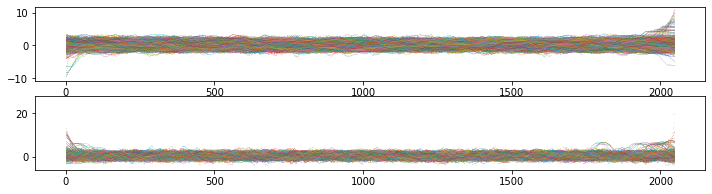

cluster 1
N samples: 200


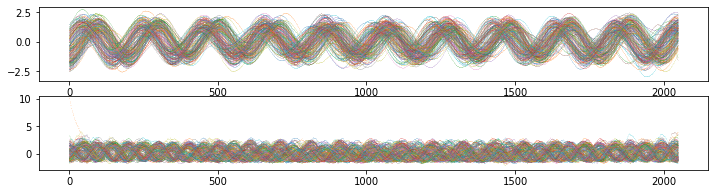

cluster 2
N samples: 54


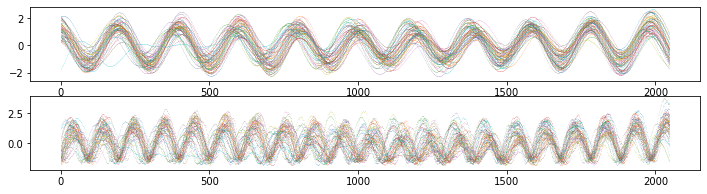

In [38]:
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=4)
clustering = dbscan.fit(encoded_2d_tsne)
sc = plt.scatter(encoded_2d_tsne[:, 0], encoded_2d_tsne[:, 1], marker='.', s=2, c=clustering.labels_, cmap='tab10')
plt.legend(*sc.legend_elements())
plt.show()
for cluster in np.unique(clustering.labels_):
    cluster_indices = np.where(clustering.labels_ == cluster)[0]
    print("cluster", cluster)
    fig, axes = plot_clusters(cluster_indices)
    plt.show()